<a href="https://colab.research.google.com/github/JohnalEco/Hurtos_Medellin/blob/main/Hurtos_git.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Análisis Espacial de Hurtos en Medellín
Este Jupyter Notebook presenta un análisis espacial detallado de los hurtos ocurridos en los barrios de Medellín, Colombia. Utilizando datos geoespaciales y probabilidades bayesianas, se examinan las probabilidades de ser robado en diferentes barrios, considerando diversas categorías de armas y variables demográficas.

# Descripción del Proyecto

El objetivo principal de este análisis es proporcionar una visión clara y detallada de los patrones de criminalidad en Medellín, ayudando a identificar las áreas con mayores riesgos de hurto y los factores que influyen en estos delitos. El análisis incluye:

Carga y Limpieza de Datos: Lectura de los datos de hurtos y geoespaciales, seguido de un proceso de limpieza y filtrado para asegurar la calidad de los datos utilizados.
Análisis Exploratorio: Exploración inicial de los datos para identificar tendencias y patrones generales en los hurtos reportados.
Mapas de Calor: Visualización de la densidad de hurtos en diferentes barrios utilizando mapas de calor interactivos.
Probabilidades de Hurtos por Barrio: Cálculo de las probabilidades de ser robado en cada barrio, considerando diferentes tipos de armas.
Probabilidades Bayesianas: Análisis de las probabilidades de ser robado basado en el sexo (hombre/mujer) de la víctima, utilizando métodos bayesianos.
Visualización de Resultados: Generación de gráficos y mapas para visualizar los resultados del análisis, destacando los barrios con mayor riesgo de hurto y las diferencias en probabilidades según las variables estudiadas.

# Archivos Incluidos



*   hurto_a_persona.csv: Dataset con los registros de hurtos ocurridos en Medellín.
*   BarrioVereda_2014.shp: Archivo shapefile con la delimitación geográfica de los barrios de Medellín.
*   Notebook de Análisis: Este Jupyter Notebook contiene todo el código necesario para realizar el análisis, incluyendo la carga de datos, el procesamiento, el análisis y la visualización de los resultados.

# Cómo Usar Este Notebook

*   Preparar el Entorno: Asegúrate de tener instaladas todas las dependencias necesarias. Puedes utilizar requirements.txt para instalar las dependencias con pip.
*   Cargar los Datos: Coloca los archivos de datos en la misma carpeta que el Notebook o especifica la ruta correcta.
*   Ejecutar las Celdas: Sigue las instrucciones y ejecuta cada celda del Notebook para reproducir el análisis y las visualizaciones.
*   Explorar los Resultados: Utiliza las visualizaciones y mapas interactivos para explorar los resultados del análisis.





# Importando las librerias necesarias

1. osmnx
 es una librería de Python que facilita la descarga y el trabajo con datos geoespaciales de OpenStreetMap. Es particularmente útil para obtener redes de calles, edificios y otros elementos geográficos.
Uso en el Proyecto: Se utiliza para descargar y visualizar el mapa base de Medellín, proporcionando un contexto geográfico para los análisis espaciales.

In [1]:
pip install osmnx

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.2/107.2 kB 2.7 MB/s eta 0:00:00


2. contextily
es una librería que permite agregar mapas de fondo (basemaps) a gráficos y visualizaciones geoespaciales en Python, utilizando datos de diversos proveedores de tiles como OpenStreetMap y CartoDB.
Uso en el Proyecto: Se emplea para añadir mapas de fondo a las visualizaciones, mejorando la interpretación de los datos espaciales.

In [2]:
pip install contextily

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.5/21.5 MB 33.4 MB/s eta 0:00:00


3. mapclassify
proporciona herramientas para la clasificación de datos espaciales, permitiendo agrupar y categorizar valores para una mejor visualización en mapas coropléticos.
Uso en el Proyecto: Se utiliza para clasificar las probabilidades de hurtos en diferentes barrios, facilitando la creación de mapas de calor y otras visualizaciones.

In [3]:
pip install mapclassify

4. pysal
(Python Spatial Analysis Library) es un conjunto de módulos para el análisis espacial, proporcionando herramientas para la manipulación y análisis de datos geoespaciales.
Uso en el Proyecto: Se utiliza para realizar análisis espaciales avanzados, como el cálculo del índice de Moran y otras estadísticas espaciales que ayudan a entender la distribución de hurtos.

In [4]:
pip install pysal geopandas

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 24.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.4/132.4 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.1/61.1 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.4/58.4 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 141.3/141.3 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.1/54.1 kB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.9/47.9 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 277.8/277.8 kB 16.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.4/41.4 kB 3.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 331.8/331.8 kB 18.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 24.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━

5. esda
(Exploratory Spatial Data Analysis) es un módulo de pysal que proporciona herramientas para el análisis exploratorio de datos espaciales, incluyendo estadísticas espaciales y pruebas de autocorrelación.
Uso en el Proyecto: Se emplea para realizar análisis exploratorios de los datos de hurtos, ayudando a identificar patrones espaciales y relaciones significativas.

In [5]:
pip install esda

# Importe de las librerias
las librerias mas comunes no se añadio su pip install dado la alta posibilidad de que ya se encuentren instaladas en su entorno

In [6]:
import pandas as pd
import folium
from folium.plugins import HeatMap
import osmnx as ox
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import pysal
import esda
from pysal.lib import weights
from pysal.explore import esda
from pysal.viz import splot
import seaborn as sns
import contextily as ctx
import mapclassify as mc

/usr/local/lib/python3.10/dist-packages/spaghetti/network.py:42: FutureWarning: The next major release of pysal/spaghetti (2.0.0) will drop support for all ``libpysal.cg`` geometries. This change is a first step in refactoring ``spaghetti`` that is expected to result in dramatically reduced runtimes for network instantiation and operations. Users currently requiring network and point pattern input as ``libpysal.cg`` geometries should prepare for this simply by converting to ``shapely`` geometries.
  warnings.warn(dep_msg, FutureWarning, stacklevel=1)


# Cargue de Archivo de hurtos a personas en Medellin

In [7]:
hurto_a_persona = pd.read_csv("/content/hurto_a_persona.csv")
hurto_a_persona.head(10)

<ipython-input-7-9e95ce0bb8f5>:1: DtypeWarning: Columns (25) have mixed types. Specify dtype option on import or set low_memory=False.
  hurto_a_persona = pd.read_csv("/content/hurto_a_persona.csv")


,fecha_hecho,cantidad,latitud,longitud,sexo,edad,estado_civil,grupo_actor,actividad_delictiva,parentesco,...,lugar,sede_receptora,bien,categoria_bien,grupo_bien,modelo,color,permiso,unidad_medida,fecha_ingestion
0,2017-01-01T01:00:00.000-05:00,1.0,6.299703,-75.582016,Mujer,33,Unión marital de hecho,Sin dato,Sin dato,Sin dato,...,Vía pública,Doce de Octubre,Celular,Tecnología,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00
1,2017-01-01T15:00:00.000-05:00,1.0,6.250917,-75.566160,Mujer,26,Soltero(a),Sin dato,Sin dato,Sin dato,...,Vía pública,Candelaria,Celular,Tecnología,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00
2,2017-01-01T14:00:00.000-05:00,1.0,6.274836,-75.554909,Hombre,30,Soltero(a),Sin dato,Sin dato,Sin dato,...,Vía pública,Aranjuez,Celular,Tecnología,Mercancía,-1,Negro,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00
3,2017-01-01T16:00:00.000-05:00,1.0,6.276236,-75.553533,Hombre,37,Casado(a),Sin dato,Sin dato,Sin dato,...,Vía pública,Aranjuez,Celular,Tecnología,Mercancía,-1,Negro,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00
4,2017-01-01T16:00:00.000-05:00,1.0,6.250339,-75.586914,Hombre,87,Casado(a),Sin dato,Sin dato,Sin dato,...,Vía pública,Laureles,Billetera,Prendas de vestir y accesorios,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00
5,2017-01-01T16:00:00.000-05:00,1.0,6.219071,-75.602996,Mujer,29,Unión marital de hecho,Sin dato,Sin dato,Sin dato,...,Vía pública,Belén,Elementos escolares,Elementos escolares,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00
6,2017-01-01T20:30:00.000-05:00,1.0,6.317709,-75.678259,Hombre,27,Soltero(a),Sin dato,Sin dato,Sin dato,...,Vía pública,Doce de Octubre,Cámara,Tecnología,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00
7,2017-01-01T16:00:00.000-05:00,1.0,6.268307,-75.558457,Hombre,36,Soltero(a),Sin dato,Sin dato,Sin dato,...,Hospital o centro de salud,Aranjuez,Peso,"Dinero, joyas, piedras preciosas y título valor",Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00
8,2017-01-01T00:30:00.000-05:00,1.0,6.242797,-75.554797,Hombre,41,Casado(a),Sin dato,Sin dato,Sin dato,...,Vía pública,Buenos Aires,Peso,"Dinero, joyas, piedras preciosas y título valor",Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00
9,2017-01-01T08:00:00.000-05:00,1.0,6.246823,-75.562114,Hombre,59,Soltero(a),Sin dato,Sin dato,Sin dato,...,Vía pública,Candelaria,Peso,"Dinero, joyas, piedras preciosas y título valor",Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00


# Limpieza inicial de los datos
Se eliminan las obervacion que contengan valores nulos

In [8]:
datos_limpios = hurto_a_persona.dropna(subset=['latitud', 'longitud'])
datos_limpios = datos_limpios[(datos_limpios['latitud'] != 0) & (datos_limpios['longitud'] != 0)]

# Sección nueva Creacion de un primer mapa de calor
Para visualizar la distribución geográfica de los hurtos en Medellín, se utiliza un mapa de calor. Este tipo de visualización ayuda a identificar las áreas con mayor incidencia de hurtos cometidos con armas cortopunzantes. A continuación, se describen los pasos realizados para crear este mapa de calor.

**Qué se hace:** folium es una biblioteca de Python que permite la creación de mapas interactivos, y HeatMap es una extensión de folium utilizada específicamente para generar mapas de calor.

Este primer mapa es un acercamiento a ver la densidad de hurtos en Medellin, sin embargo hay varias cosas adicionales que cada observacion tiene por mostrar.

In [9]:
#Centrar el mapa en Medellin
mapa_calor_limpios = folium.Map(location=[6.2442, -75.5918], zoom_start=12)

#Preparar los datos para el mapa de calor
heat_data = [[row['latitud'], row['longitud']] for index, row in datos_limpios.iterrows()]

#Crear el mapa de calor
HeatMap(heat_data, blur=5, max_zoom=5, radius=6).add_to(mapa_calor_limpios)

#Mostrar el mapa
mapa_calor_limpios

# ¿Cómo puedo obtener el mapa de Medellín, Colombia?

Usando la función geocode_to_gdf de osmnx, se puede obtener un GeoDataFrame que representa la ciudad de Medellín. a este mapa se le pueden añadir a gusto gran cantidad de atributos, queda a consideracion el uso de ellos para diferentes intenciones

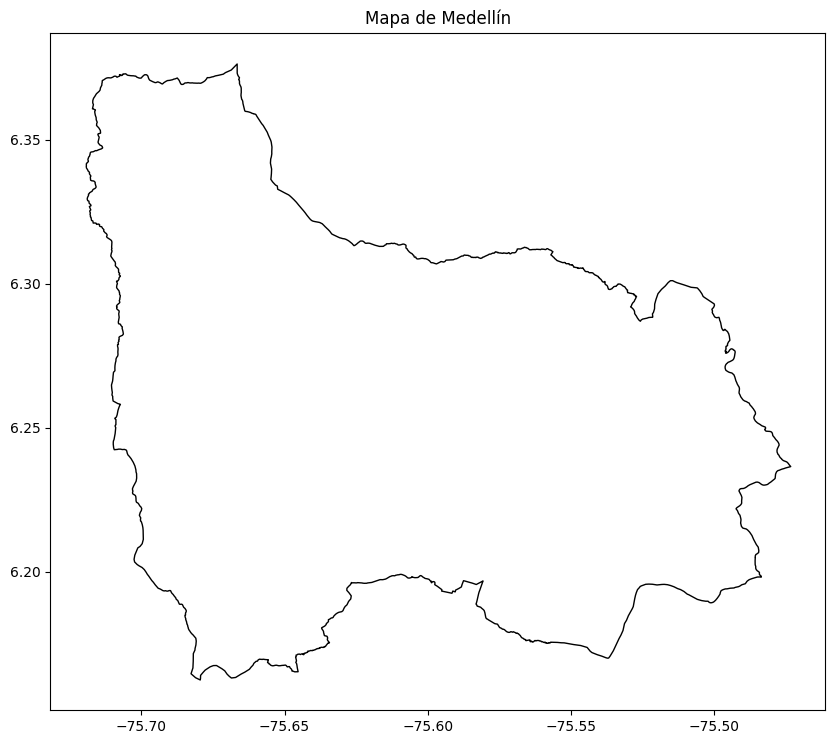

In [10]:
# Obtener el mapa de Medellín utilizando osmnx
medellin = ox.geocode_to_gdf('Medellín, Colombia')

# Plotear el mapa de Medellín
fig, ax = plt.subplots(figsize=(10, 10))
medellin.plot(ax=ax, color='white', edgecolor='black')
plt.title('Mapa de Medellín')
plt.show()

# Que otra alternativa existe para obtener un mapa de Medellin?

Generalmente, las ciudades cuentan con archivos de tipo shapefile (shp) que contienen polígonos que delimitan tanto el perímetro de la ciudad como sus barrios. Estos archivos son útiles para representar de manera precisa los límites geográficos y administrativos. En este proyecto, utilizaremos un archivo shapefile para obtener los límites de los barrios de Medellín. Este archivo está incluido en los archivos del repositorio y se denomina BarrioVereda_2014.shp.

Al cargar este archivo con la funcion gpd.read() se nos cargara un geopandas que contendra una columna llamada "geometry" que contendra el poligono de cada barrio

In [11]:
#Cargar el archivo shp
barrios = gpd.read_file("/content/BarrioVereda_2014.shp")
barrios.head(5)

,CODIGO,NOMBRE,ABREVIATUR,IDENTIFICA,LIMITECOMU,ZHFISICAGE,LIMITEMUNI,VIGENCIA_F,SUBTIPO_BA,LINK_DOCUM,geometry
0,Inst_15,U.P.B,None,Inst_15,11,None,001,None,1,None,"POLYGON ((-75.58911 6.24447, -75.58900 6.24443..."
1,Inst_18,Cerro Nutibara,None,Inst_18,16,None,001,None,1,None,"POLYGON ((-75.57669 6.23733, -75.57628 6.23612..."
2,0610,Mirador del Doce,None,0610,06,None,001,None,1,None,"POLYGON ((-75.58450 6.30520, -75.58445 6.30519..."
3,1620,El Nogal-Los Almendros,None,1620,16,None,001,None,1,None,"POLYGON ((-75.59551 6.23662, -75.59552 6.23660..."
4,0612,El Triunfo,None,0612,06,None,001,None,1,None,"POLYGON ((-75.58618 6.31007, -75.58616 6.31007..."


# Visualizar el mapa de medellin

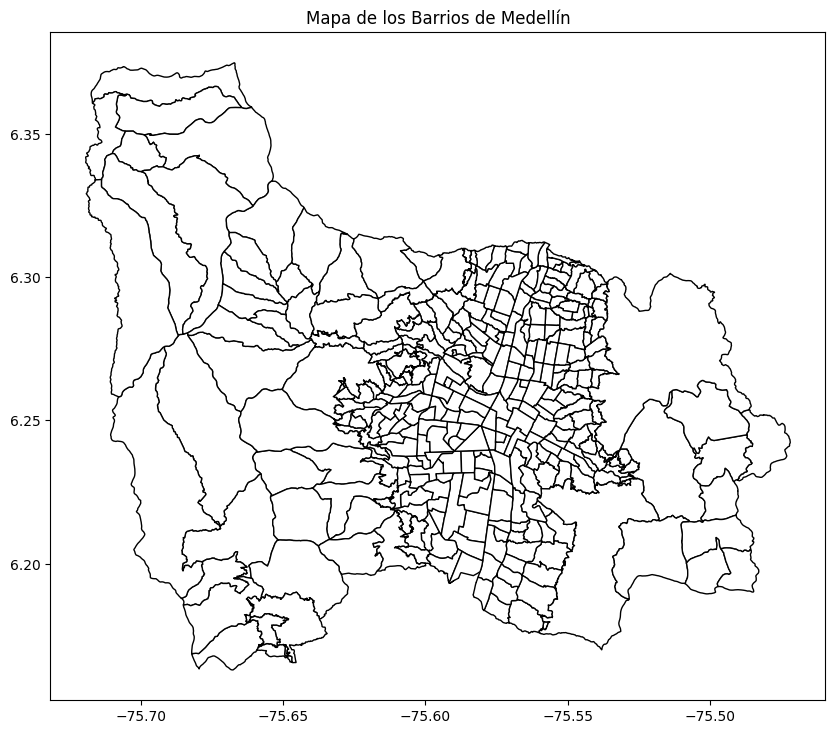

In [12]:
fig, ax = plt.subplots(figsize=(10, 10))
barrios.plot(ax=ax, edgecolor='black', color='white')
plt.title('Mapa de los Barrios de Medellín')
plt.show()

# Convertir los Datos de Hurtos a un GeoDataFrame
Esto convertira nuestro df original en un GeoDataFrame, si nos fijamos en la columna geometry habra un POINT, a diferencia de nuestro archivo "barrios" que contiene un poligono


In [13]:
gdf_hurtos = gpd.GeoDataFrame(datos_limpios, geometry=gpd.points_from_xy(datos_limpios.longitud, datos_limpios.latitud), crs='EPSG:4326')
gdf_hurtos.head(5)

,fecha_hecho,cantidad,latitud,longitud,sexo,edad,estado_civil,grupo_actor,actividad_delictiva,parentesco,...,sede_receptora,bien,categoria_bien,grupo_bien,modelo,color,permiso,unidad_medida,fecha_ingestion,geometry
0,2017-01-01T01:00:00.000-05:00,1.0,6.299703,-75.582016,Mujer,33,Unión marital de hecho,Sin dato,Sin dato,Sin dato,...,Doce de Octubre,Celular,Tecnología,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,POINT (-75.58202 6.29970)
1,2017-01-01T15:00:00.000-05:00,1.0,6.250917,-75.566160,Mujer,26,Soltero(a),Sin dato,Sin dato,Sin dato,...,Candelaria,Celular,Tecnología,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,POINT (-75.56616 6.25092)
2,2017-01-01T14:00:00.000-05:00,1.0,6.274836,-75.554909,Hombre,30,Soltero(a),Sin dato,Sin dato,Sin dato,...,Aranjuez,Celular,Tecnología,Mercancía,-1,Negro,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,POINT (-75.55491 6.27484)
3,2017-01-01T16:00:00.000-05:00,1.0,6.276236,-75.553533,Hombre,37,Casado(a),Sin dato,Sin dato,Sin dato,...,Aranjuez,Celular,Tecnología,Mercancía,-1,Negro,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,POINT (-75.55353 6.27624)
4,2017-01-01T16:00:00.000-05:00,1.0,6.250339,-75.586914,Hombre,87,Casado(a),Sin dato,Sin dato,Sin dato,...,Laureles,Billetera,Prendas de vestir y accesorios,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,POINT (-75.58691 6.25034)


# ¿Cómo puedo unir datos de hurtos con información de barrios en Medellín utilizando geopandas?

Para unir los datos de hurtos con la información de los barrios en Medellín, necesitamos utilizar operaciones espaciales que nos permitan relacionar cada registro de hurtos con el barrio correspondiente.

Utilizando la función gpd.sjoin() de geopandas

In [14]:
hurto_barrios = gpd.sjoin(gdf_hurtos, barrios, how="left", predicate="within")
print(hurto_barrios.info(verbose=True))

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 284545 entries, 0 to 298782
Data columns (total 48 columns):
 #   Column               Non-Null Count   Dtype   
---  ------               --------------   -----   
 0   fecha_hecho          284545 non-null  object  
 1   cantidad             284545 non-null  float64 
 2   latitud              284545 non-null  float64 
 3   longitud             284545 non-null  float64 
 4   sexo                 284545 non-null  object  
 5   edad                 284545 non-null  int64   
 6   estado_civil         284545 non-null  object  
 7   grupo_actor          284545 non-null  object  
 8   actividad_delictiva  284545 non-null  object  
 9   parentesco           284545 non-null  object  
 10  ocupacion            284545 non-null  object  
 11  discapacidad         284545 non-null  object  
 12  grupo_especial       284545 non-null  object  
 13  medio_transporte     284545 non-null  object  
 14  nivel_academico      284545 non-null  object  
 1

# ¿Cómo puedo contar el número de registros de hurtos por cada barrio en Medellín?

Para realizar esta tarea, necesitamos agrupar los datos por los polígonos de los barrios y contar cuántos registros de hurtos hay dentro de cada uno.

Utilizando el método groupby() de pandas y size()

Utilizamos el método groupby() en el GeoDataFrame hurto_barrios agrupando por la columna index_right, que contiene el índice de los polígonos de los barrios a los que pertenecen los registros de hurtos.

hurto_counts será una serie (o DataFrame si se utiliza reset_index()) que contendrá el número de registros de hurtos por cada índice de polígono de barrio. Cada índice corresponde a un barrio específico en Medellín.

Ademas agregaremos hurto_counts dentro de el df de barrios para tener la metrica de hurtos por barrio

In [15]:
hurto_counts = hurto_barrios.groupby('index_right').size()
barrios['hurto_count'] = barrios.index.map(hurto_counts).fillna(0)

# ¿Cómo puedo generar un mapa de calor de hurtos por barrios en Medellín usando Matplotlib y Contextily?



Creación de la figura y los ejes sin la base de contextily

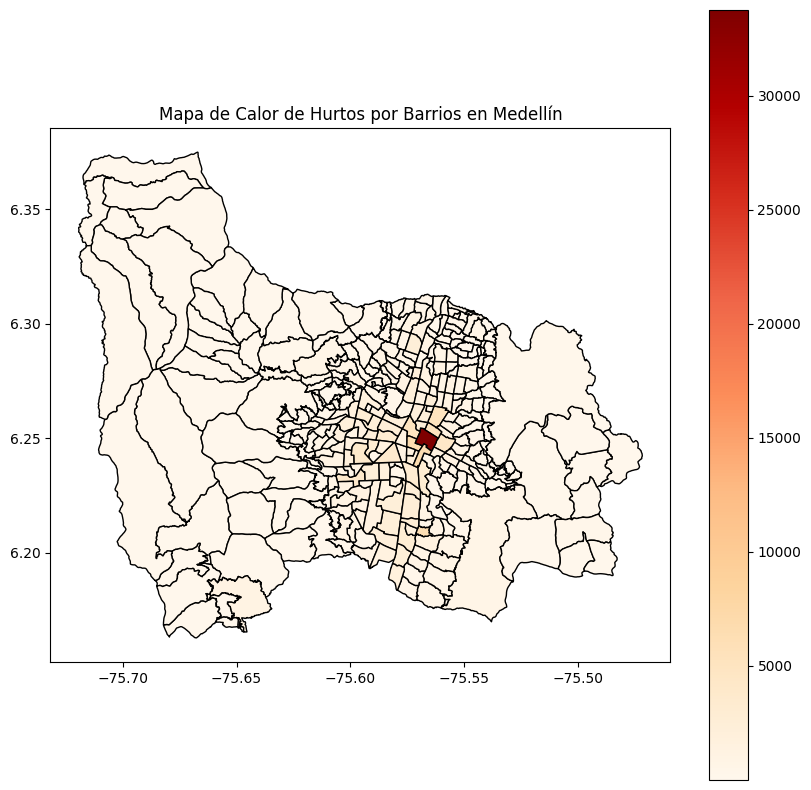

In [16]:
fig, ax = plt.subplots(figsize=(10, 10))
barrios.plot(column='hurto_count', ax=ax, legend=True, cmap='OrRd', edgecolor='black')
plt.title('Mapa de Calor de Hurtos por Barrios en Medellín')
plt.show()

Creación de la figura y los ejes con la base de contextily

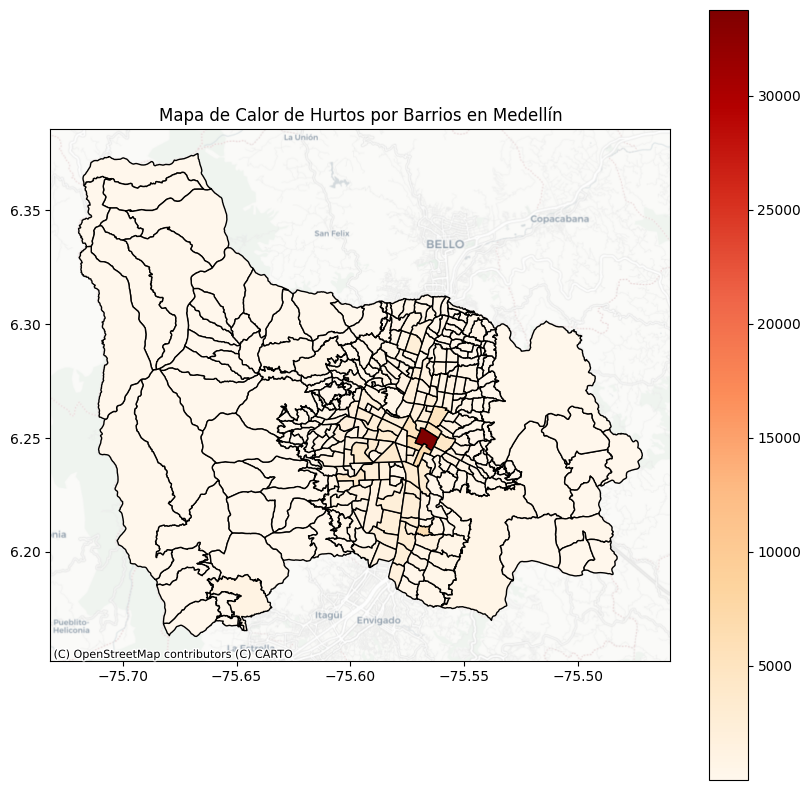

In [17]:
fig, ax = plt.subplots(figsize=(10, 10))
barrios.plot(column='hurto_count', ax=ax, legend=True, cmap='OrRd', edgecolor='black')
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=barrios.crs.to_string())
plt.title('Mapa de Calor de Hurtos por Barrios en Medellín')
plt.show()

El mapa revela claramente un problema de visualización al mostrar una concentración significativa de hurtos en un barrio específico de Medellín (La Candelaria). Debido a la amplia escala de diferencias entre los datos, es necesario ajustar los intervalos para que las gráficas puedan ofrecer una representación más informativa y detallada.

# ¿Cómo se puede visualizar el mapa de calor de hurtos por barrios en Medellín utilizando esquemas de clasificación basados en quantiles?

Usamos ***classifier = mc.Quantiles(barrios['hurto_count']***, k=12) de la libreria mapclassify: Primero, el programa divide los barrios de Medellín en grupos basados en la cantidad de hurtos que tienen. Esto nos ayuda a ver claramente qué áreas tienen más problemas de seguridad y cuáles menos, podemos modficar el parametro **k** para añadir o quitar cuantiles

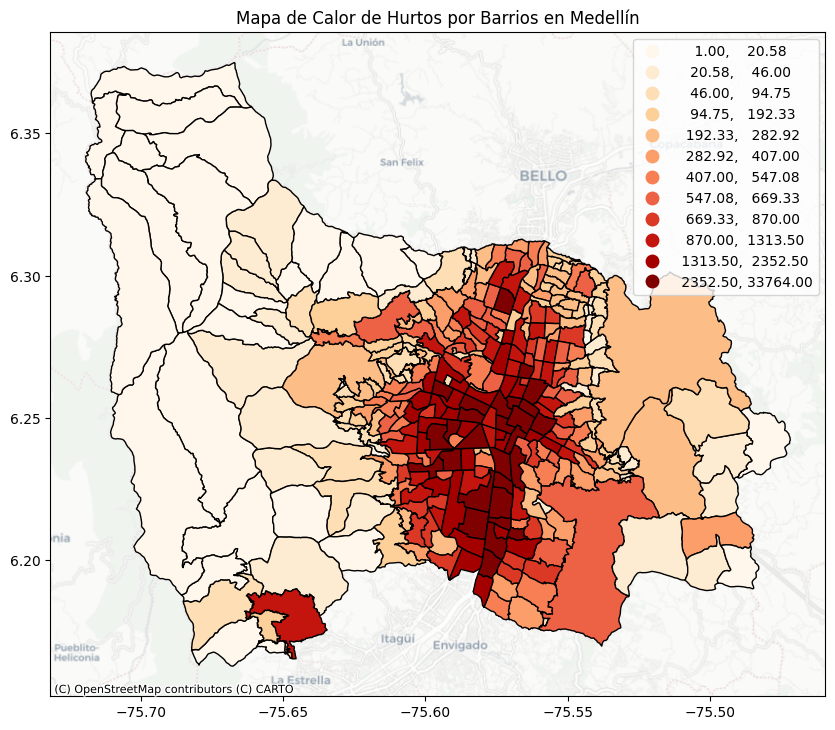

In [18]:
classifier = mc.Quantiles(barrios['hurto_count'], k=12)
fig, ax = plt.subplots(figsize=(10, 10))
barrios.plot(column='hurto_count', ax=ax, legend=True, cmap='OrRd', scheme='Quantiles', classification_kwds={'k': 12}, edgecolor='black')
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=barrios.crs.to_string())

plt.title('Mapa de Calor de Hurtos por Barrios en Medellín')
plt.show()

# Índice de Moran y Contigüidad Reina: Análisis de Autocorrelación Espacial

**¿Qué es el Índice de Moran?**
El Índice de Moran es una medida estadística utilizada para evaluar la autocorrelación espacial de los datos. En términos sencillos, nos ayuda a determinar si los valores similares están agrupados espacialmente (autocorrelación positiva) o si están distribuidos de manera aleatoria (autocorrelación negativa o nula).

**Contigüidad Tipo Reina:**
En el contexto del análisis espacial, la contigüidad tipo reina se refiere a la definición de vecindad entre unidades geográficas, como los barrios en tu caso. Bajo la contigüidad tipo reina, dos unidades geográficas (en este caso, barrios) se consideran vecinas si comparten al menos un punto de su frontera.

Aquí, ***weights.Queen.from_dataframe(barrios)*** crea una matriz de pesos basada en la contigüidad tipo reina a partir de los datos geográficos de los barrios. Esta matriz define qué barrios son vecinos entre sí según la definición de contigüidad reina.

In [19]:
w = weights.Queen.from_dataframe(barrios)

<ipython-input-19-413fbc792650>:1: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = weights.Queen.from_dataframe(barrios)


Cálculo del Índice de Moran:
***moran = esda.Moran(barrios['hurto_count'], w)***

Con la matriz de pesos definida, esda.Moran() calcula el Índice de Moran para la variable hurto_count (número de hurtos) en los barrios. Este índice cuantifica la autocorrelación espacial de los hurtos, ayudando a determinar si hay patrones espaciales significativos en la distribución de los hurtos entre los barrios.

In [20]:
moran = esda.Moran(barrios['hurto_count'], w)
print("Índice de Moran global:", moran.I)
print("Valor esperado bajo aleatoriedad espacial:", moran.EI)
print("P-valor:", moran.p_norm)
print("Valor Z:", moran.z_norm)

Índice de Moran global: 0.29698116363366467
Valor esperado bajo aleatoriedad espacial: -0.0030211480362537764
P-valor: 9.175439846422924e-21
Valor Z: 9.345155670217965


El Índice de Moran global es una medida que indica la autocorrelación espacial de los datos. En este caso, un valor de 0.297 indica que existe una autocorrelación positiva significativa entre los datos de hurto por barrio en Medellín. Esto significa que los barrios con altos índices de hurto tienden a estar cerca de otros barrios con altos índices, y lo mismo ocurre para los barrios con bajos índices de hurto. Es decir, la distribución de los hurtos no es aleatoria, sino que hay una tendencia a la agrupación espacial.

In [21]:
gdf_datos_limpios = gpd.GeoDataFrame(
    datos_limpios, geometry=gpd.points_from_xy(datos_limpios.longitud, datos_limpios.latitud))
datos_con_barrios = gpd.sjoin(gdf_datos_limpios, barrios, how="left", op='within')

/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py:3473: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):
<ipython-input-21-61a502c0fbd4>:3: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  datos_con_barrios = gpd.sjoin(gdf_datos_limpios, barrios, how="left", op='within')


# Vamos a determinar con que armas se esta robando en medellin

Este código agrupa los datos del DataFrame hurto_barrios según dos criterios: el nombre del barrio (NOMBRE) y el tipo de arma usado en el hurto (arma_medio). Esto significa que estamos contando cuántas veces ocurre cada combinación de barrio y tipo de arma en los datos de hurto.

Este proceso nos permite obtener una visión clara y cuantitativa de la distribución de los tipos de hurto en los diferentes barrios de Medellín, facilitando análisis posteriores sobre patrones de criminalidad y seguridad urbana.


In [22]:
frecuencias = hurto_barrios.groupby(['NOMBRE', 'arma_medio']).size().reset_index(name='frecuencia')
frecuencias.head(10)

,NOMBRE,arma_medio,frecuencia
0,Aguas Frias,Arma cortopunzante,3
1,Aguas Frias,Arma de fuego,7
2,Aguas Frias,No,20
3,Aldea Pablo VI,Arma cortopunzante,5
4,Aldea Pablo VI,Arma de fuego,8
5,Aldea Pablo VI,No,18
6,Alejandro Echavarría,Arma cortopunzante,142
7,Alejandro Echavarría,Arma de fuego,235
8,Alejandro Echavarría,Escopolamina,4
9,Alejandro Echavarría,No,365


Visualizando los tipos de armas que se usan en medellin para los hurtos usando un simple grafico de barras, En el dataframe original, el tipo de arma **"No"** se refiere a un hurto sin uso de arma, por lo que de aqui en adelante es importante tener esta informacion clara.

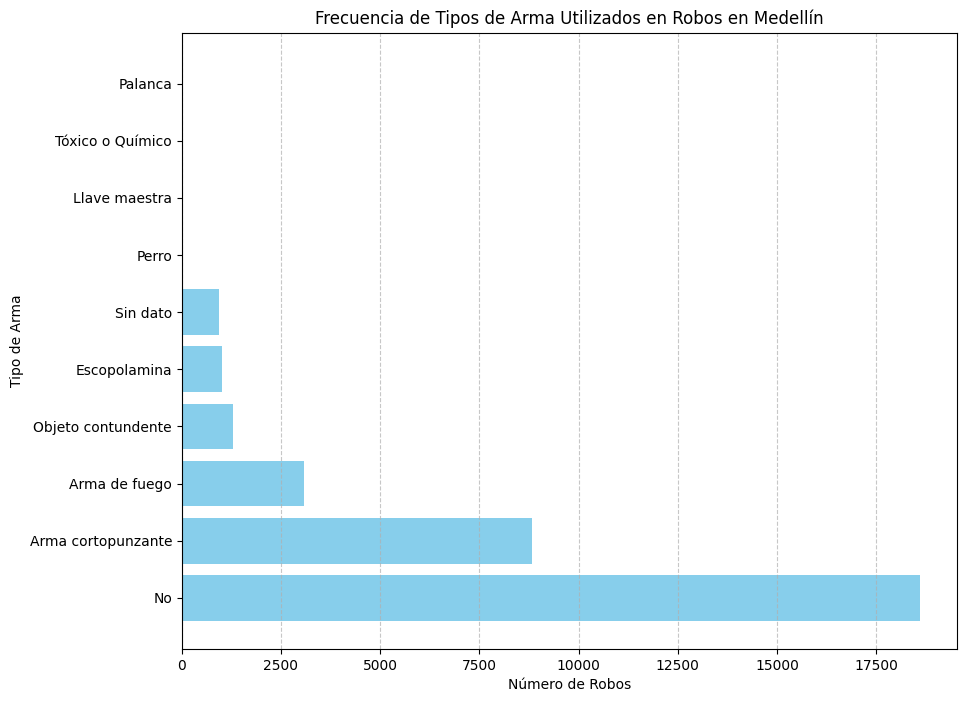

In [23]:
frecuencias = frecuencias.sort_values(by='frecuencia', ascending=False)
plt.figure(figsize=(10, 8))
bars = plt.barh(frecuencias['arma_medio'], frecuencias['frecuencia'], color='skyblue')

plt.xlabel('Número de Robos')
plt.ylabel('Tipo de Arma')
plt.title('Frecuencia de Tipos de Arma Utilizados en Robos en Medellín')
plt.grid(axis='x', linestyle='--', alpha=0.7)


# ¿Cómo se calcula la probabilidad de ocurrencia de robos con diferentes tipos de armas en cada barrio de Medellín?



*   Primero, agrupamos los datos de los robos por el tipo de arma utilizada y por cada barrio de Medellín. Esto nos permite contar cuántas veces se ha reportado un robo con un tipo específico de arma en cada barrio, lo cual hicimos anteriormente y esta en la variable **frecuencias**
*   Luego, calculamos el total de robos ocurridos en cada barrio sumando las frecuencias de todos los tipos de armas.

*   Para obtener la probabilidad de que un robo en un barrio específico sea cometido con cierto tipo de arma, dividimos la frecuencia de ese tipo de arma en ese barrio entre el total de robos en ese mismo barrio.






In [24]:
total_por_barrio = frecuencias.groupby('NOMBRE')['frecuencia'].sum()
frecuencias['probabilidad'] = frecuencias.apply(lambda row: row['frecuencia'] / total_por_barrio[row['NOMBRE']], axis=1)
frecuencias.head(10)

,NOMBRE,arma_medio,frecuencia,probabilidad
771,La Candelaria,No,18599,0.550853
768,La Candelaria,Arma cortopunzante,8824,0.261343
691,Guayaquil,No,4124,0.624470
515,El Poblado,No,3822,0.596721
769,La Candelaria,Arma de fuego,3082,0.091281
120,Barrio Colón,No,2709,0.419090
1389,San Benito,No,2325,0.451544
117,Barrio Colón,Arma cortopunzante,2304,0.356436
1710,Villa Nueva,No,1958,0.372456
1351,Prado,No,1885,0.360008


## ¿Cómo se visualizan las probabilidades de robos con diferentes armas en cada barrio de Medellín utilizando Python?



# Crear el mapa interactivo:
Aquí, se crea un objeto Map de Folium centrado en Medellín (location=[6.2442, -75.5918]) con un nivel de zoom inicial de 12 y utilizando el conjunto de teselas (tiles) de mapa de CartoDB Positron.


In [25]:
m = folium.Map(location=[6.2442, -75.5918], zoom_start=12, tiles='CartoDB positron')

#Agregar datos de probabilidades de armas por barrio:




In [26]:
for idx, row in frecuencias.iterrows():
    # Encontrar el polígono del barrio en el GeoDataFrame de barrios
    barrio_polygon = barrios[barrios['NOMBRE'] == row['NOMBRE']]['geometry'].values[0]
    barrio_centroid = barrio_polygon.centroid

    # Agregar un círculo al centro de cada barrio con tamaño proporcional a la probabilidad de ser robado con cierta arma
    folium.CircleMarker(
        location=[barrio_centroid.y, barrio_centroid.x],
        radius=row['probabilidad']*25,
        popup=f"Barrio: {row['NOMBRE']}<br>Arma: {row['arma_medio']}<br>Probabilidad: {row['probabilidad']:.2f}",
        color='crimson',
        fill=True,
        fill_color='crimson',
        fill_opacity=0.7,
        line_opacity=0.2
    ).add_to(m)

#Mostrar el mapa interactivo:
En este mapa interactivo, cada círculo representa un barrio de Medellín. Al hacer clic en cualquier barrio, se despliega información sobre el arma con mayor probabilidad de ser utilizada en robos dentro de ese barrio, junto con la probabilidad asociada. Es importante aclarar que esta probabilidad indica la frecuencia relativa de robos cometidos con esa arma en comparación con otros tipos de armas en el mismo barrio no la probabilidad de ser robado dentro del barrio.


In [27]:
m

# Unión de datos con el GeoDataFrame de barrios
 Finalmente, combinamos estos datos de frecuencias y probabilidades calculadas con el GeoDataFrame de barrios, utilizando la función merge de pandas. Esto nos permite agregar la información de las frecuencias y probabilidades al conjunto de datos geoespaciales de los barrios.

In [28]:
barrios_probabilidades = pd.merge(barrios, frecuencias, on='NOMBRE', how='left')

#¿Cómo se visualiza la probabilidad de ser robado con diferentes tipos de armas en los barrios de Medellín?

Primero, necesitamos conocer qué tipos de armas se están considerando en nuestros datos. Esto se logra utilizando el método unique() en la columna 'arma_medio' del DataFrame barrios_probabilidades.

Esto nos da una lista de todas las categorías únicas de armas que están siendo investigadas en el análisis.



In [29]:
categorias_armas = barrios_probabilidades['arma_medio'].unique()
print(categorias_armas)

['No' 'Arma de fuego' 'Arma cortopunzante' 'Objeto contundente'
 'Escopolamina' 'Sin dato' 'Palanca' 'Llave maestra' 'Tóxico o Químico'
 'Perro']


**para este analisis solo se tomara la categorias de "No" que se refiere a hurto sin arma, "Arma cortopunzante", "Arma de fuego" y Objeto contundente**

In [30]:
categorias_seleccionadas = ["No", "Arma cortopunzante", "Arma de fuego", "Objeto contundente"]
barrios_seleccionados = barrios_probabilidades[barrios_probabilidades['arma_medio'].isin(categorias_seleccionadas)]

# Creacion del plot

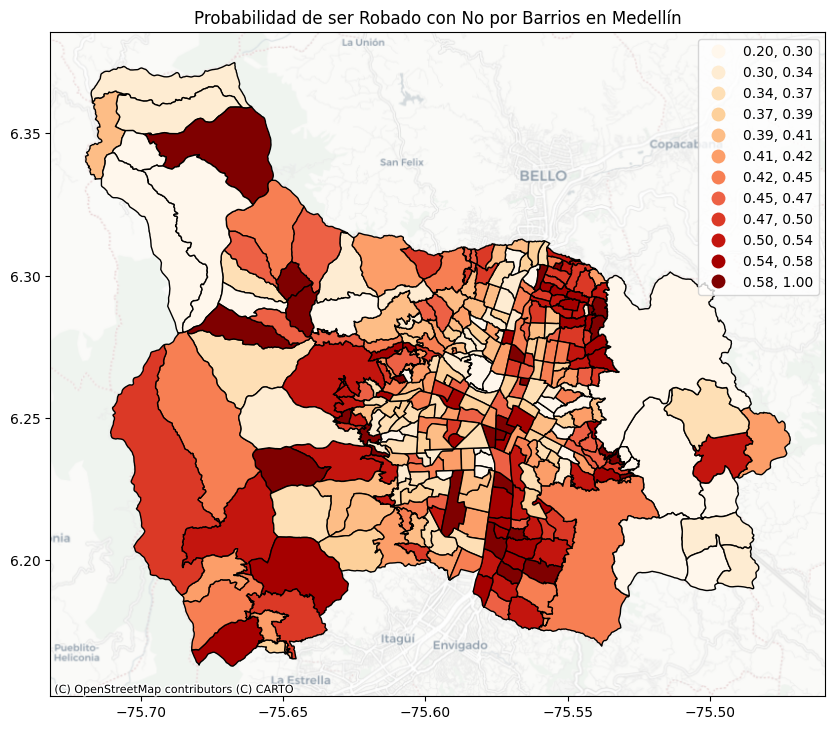

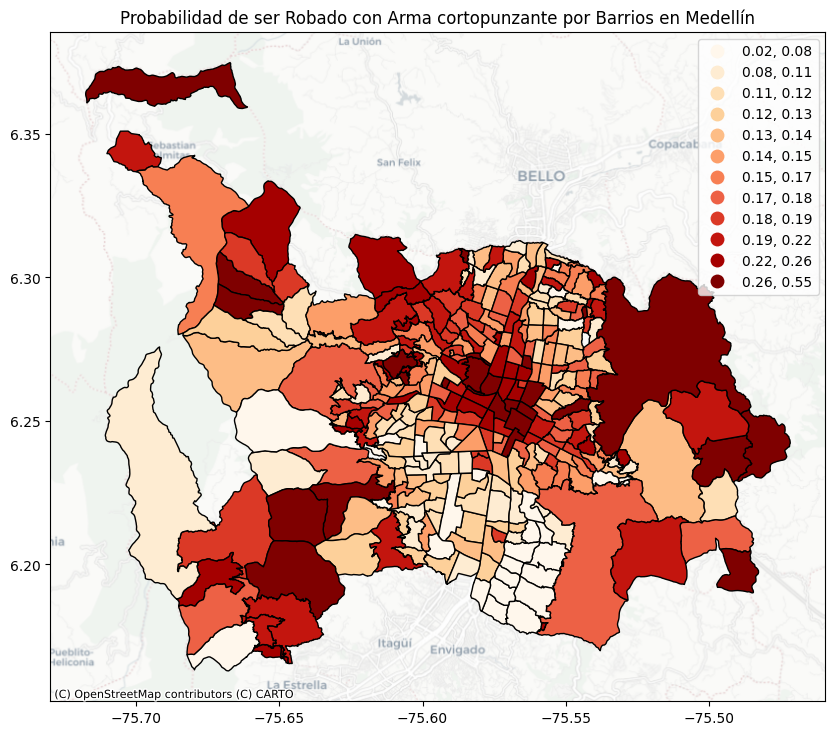

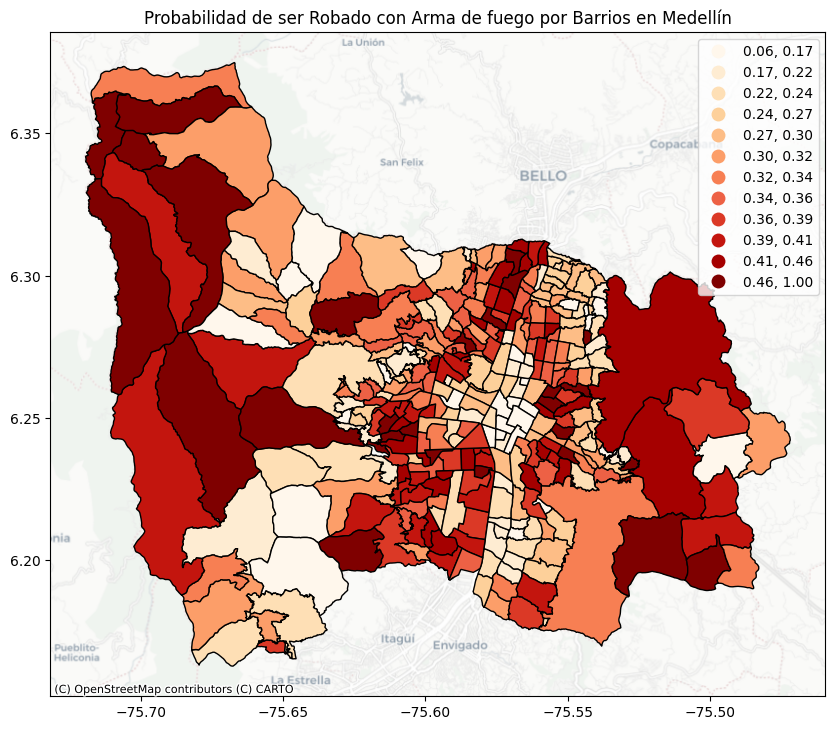

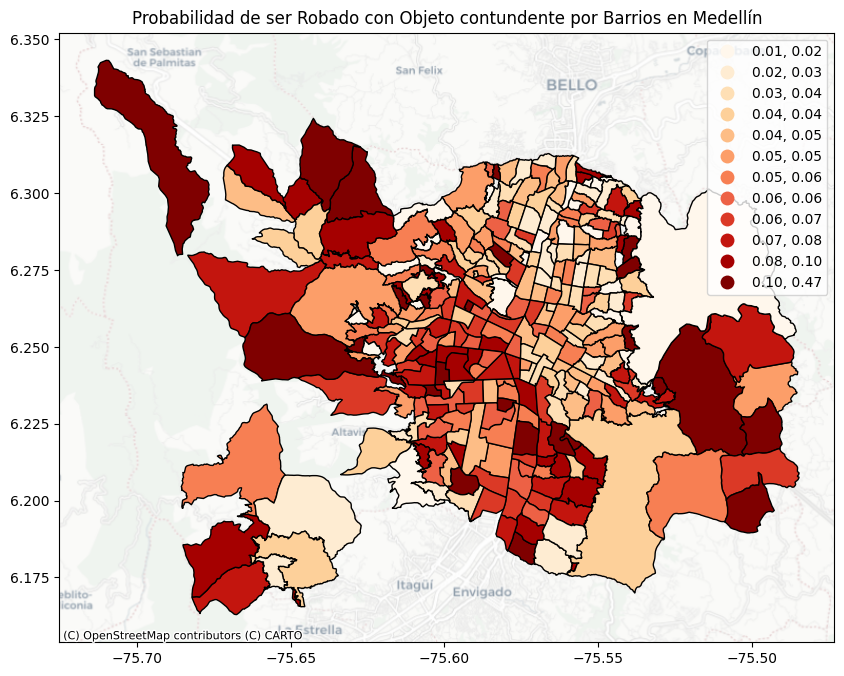

In [31]:
for categoria in categorias_seleccionadas:
    # Filtrar para obtener solo las filas donde 'arma_medio' es igual a 'categoria'
    barrios_categoria = barrios_seleccionados[barrios_seleccionados['arma_medio'] == categoria]

    # Crear el mapa
    fig, ax = plt.subplots(figsize=(10, 10))
    barrios_categoria.plot(column='probabilidad', ax=ax, legend=True, cmap='OrRd', scheme='Quantiles', classification_kwds={'k': 12}, edgecolor='black')
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=barrios_categoria.crs.to_string())

    plt.title(f'Probabilidad de ser Robado con {categoria} por Barrios en Medellín')
    plt.show()

#¿Cómo se calcula la probabilidad de ser robado en cada barrio de Medellín?


Ordenamiento por frecuencia de hurtos:

In [32]:
barrios = barrios.sort_values(by='hurto_count', ascending=False)

Cálculo del total de hurtos:


In [33]:
total_hurtos = barrios['hurto_count'].sum()

Cálculo de la probabilidad de ser robado en cada barrio:


In [34]:
barrios['probabilidad'] = barrios['hurto_count'] / total_hurtos

Visualización del resultado:



In [35]:
print(barrios[['NOMBRE', 'probabilidad']].head(25))


                 NOMBRE  probabilidad
258       La Candelaria      0.118850
196           Guayaquil      0.023246
262        Barrio Colón      0.022753
183          El Poblado      0.022546
223         Villa Nueva      0.018505
47                Prado      0.018431
130          San Benito      0.018125
145              Boston      0.015094
102               Belén      0.013802
140            Laureles      0.013348
164  Los Conquistadores      0.012686
186            Naranjal      0.011275
153    Perpetuo Socorro      0.011021
98          Bolivariana      0.010898
43         Patio Bonito      0.010602
220           San Diego      0.010486
259              Manila      0.009958
300             Estadio      0.009919
15      Barrio Colombia      0.009233
241        Suramericana      0.009180
191             Sevilla      0.008902
226       Villa Carlota      0.008825
19           Campo Amor      0.008733
20        La Aguacatala      0.008490
298            Castilla      0.008452


#¿Cómo se identifican y visualizan los barrios con mayor probabilidad de ser robados con diferentes tipos de armas en Medellín?




*   Definición de categorías seleccionadas
*   Iteración sobre cada categoría de arma
*   Selección y ordenamiento de los barrios
*   Creación del gráfico de barras horizontal

Se hizo una seleccion de los 20 barrios con mas probabilidad de ocurrencia dado un tipo de arma, sin embargo, se puede modificar variando el ***.head()*** con el criterio que se requiera, ademas se modifico para que no aparecieras los barrios con 100% de probabilidad de ocurrencia dado que estos barrios daban estos resultados por el poco numero de observaciones

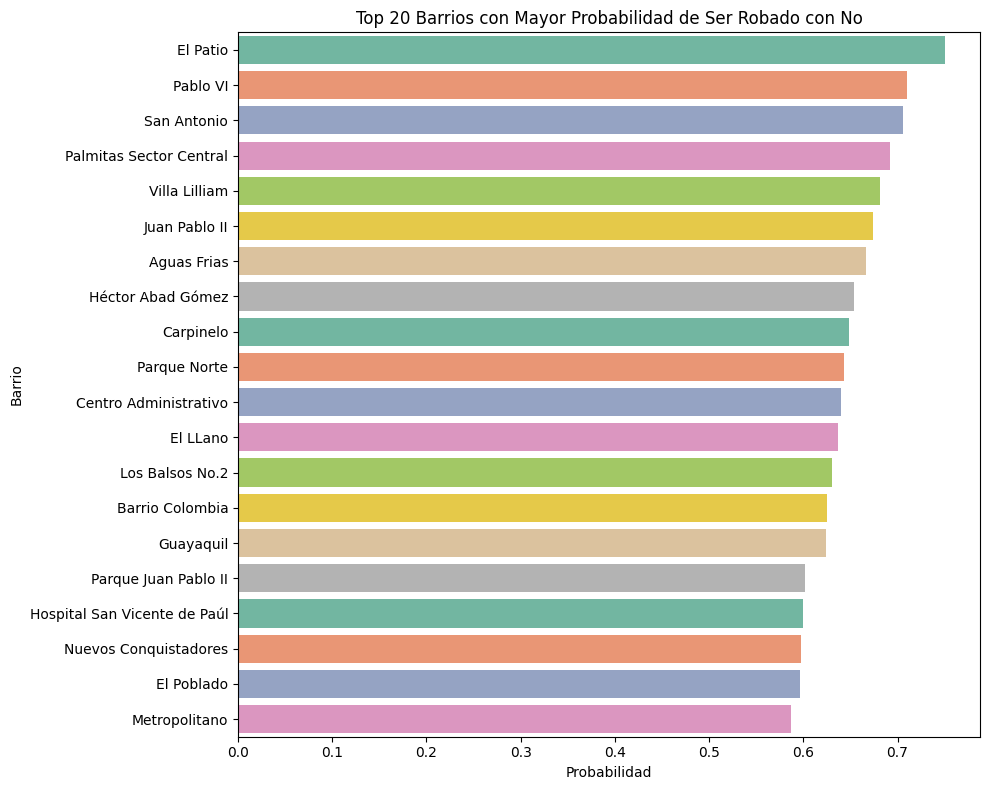

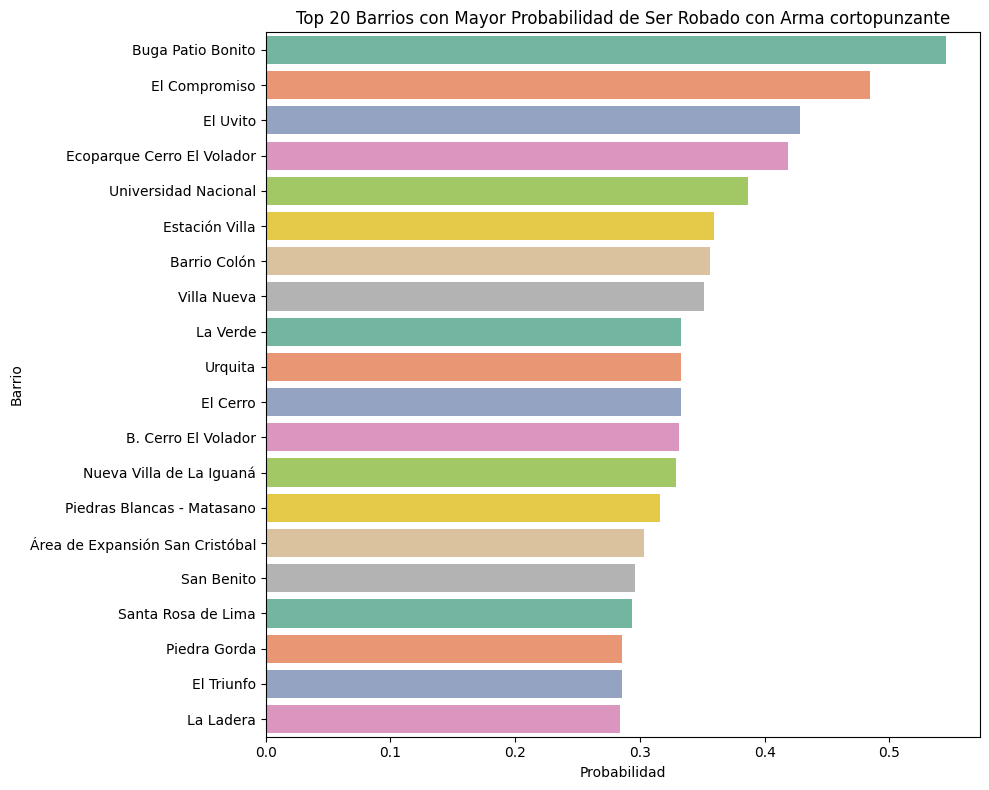

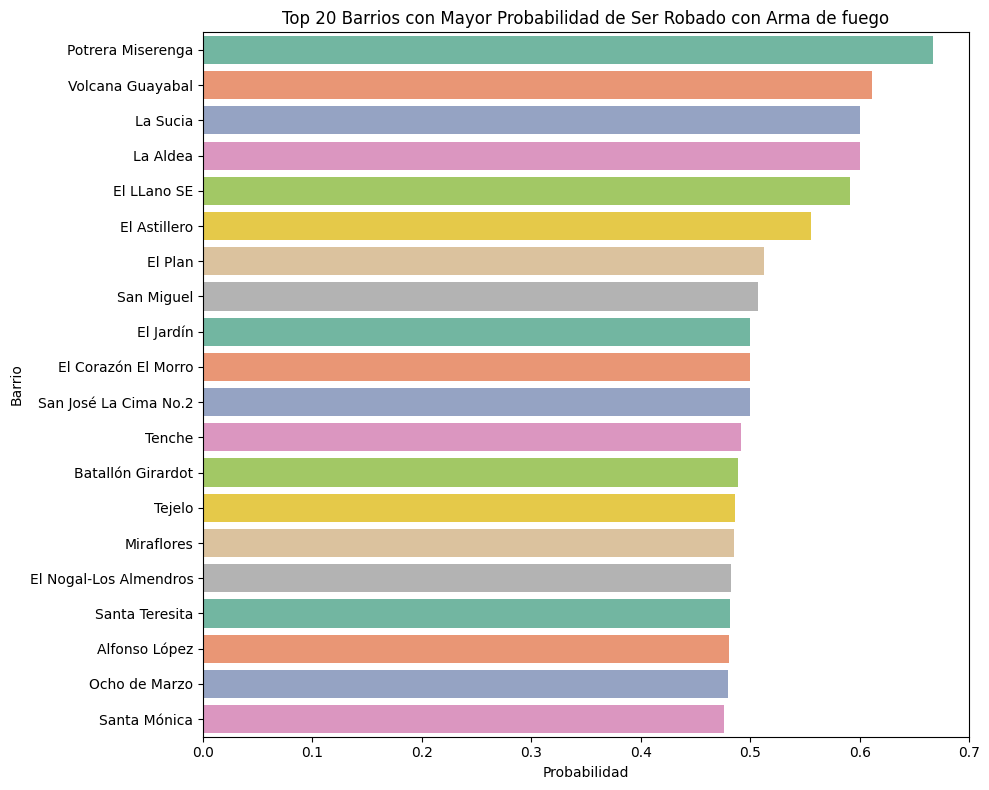

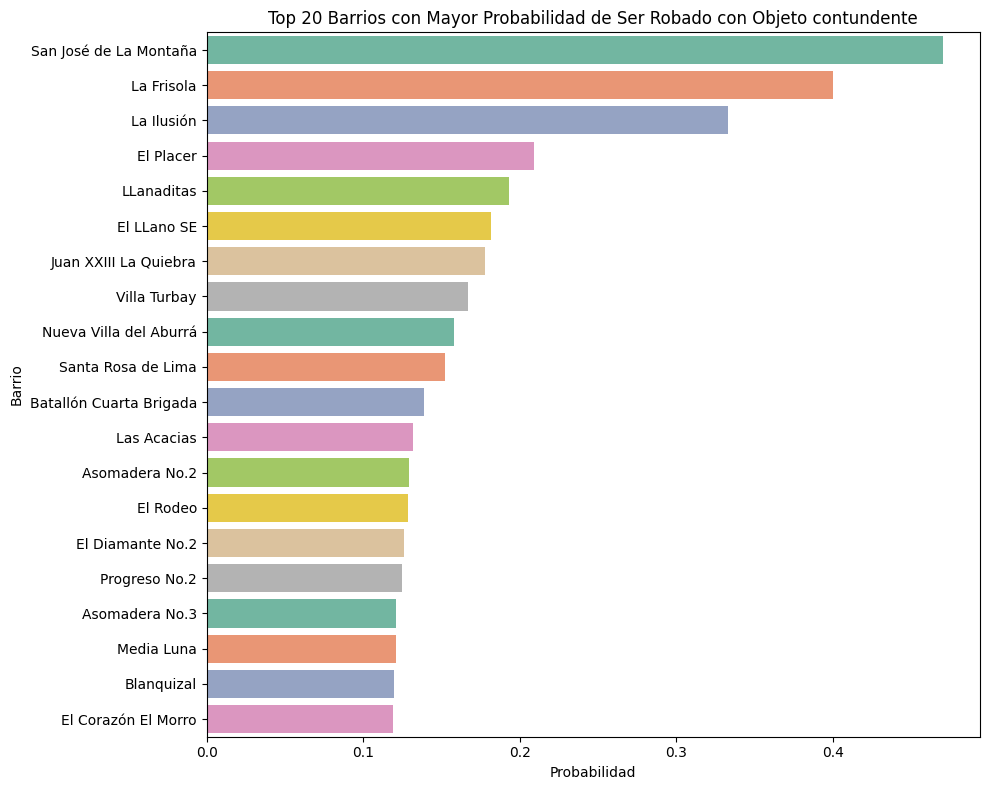

In [36]:
for categoria in categorias_seleccionadas:
    barrios_filtrados = barrios_probabilidades[(barrios_probabilidades['arma_medio'] == categoria) &
                                               (barrios_probabilidades['probabilidad'] != 1)]

    barrios_filtrados = barrios_filtrados.sort_values(by='probabilidad', ascending=False).head(20)

    plt.figure(figsize=(10, 8))
    sns.barplot(x='probabilidad', y='NOMBRE', data=barrios_filtrados, palette='Set2', hue='NOMBRE', legend=False)
    plt.title(f'Top 20 Barrios con Mayor Probabilidad de Ser Robado con {categoria}')
    plt.xlabel('Probabilidad')
    plt.ylabel('Barrio')
    plt.tight_layout()
    plt.show()

#Otra estretegia de visualización

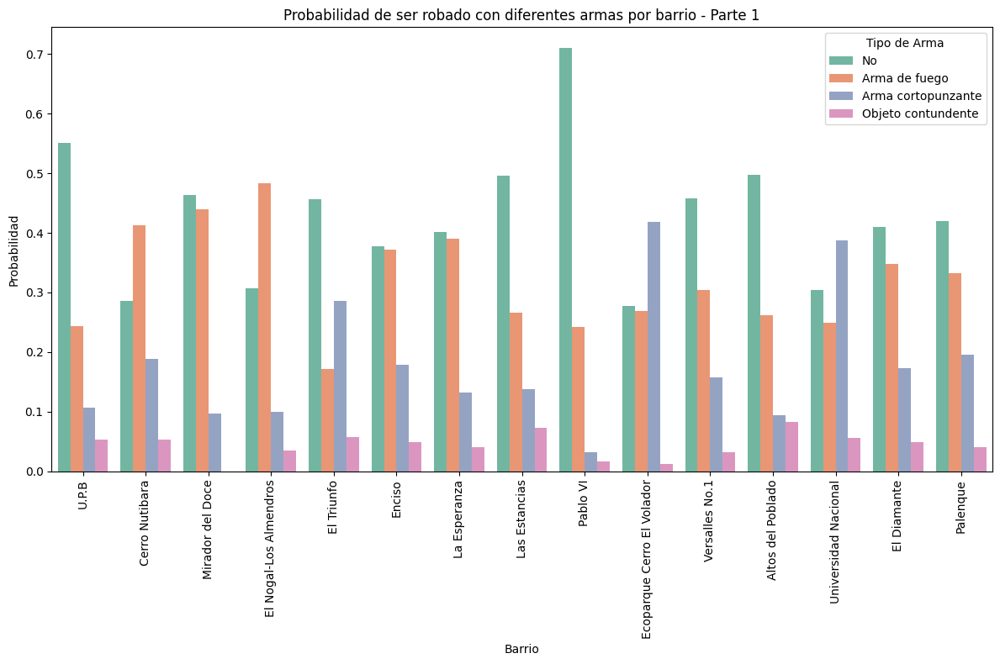

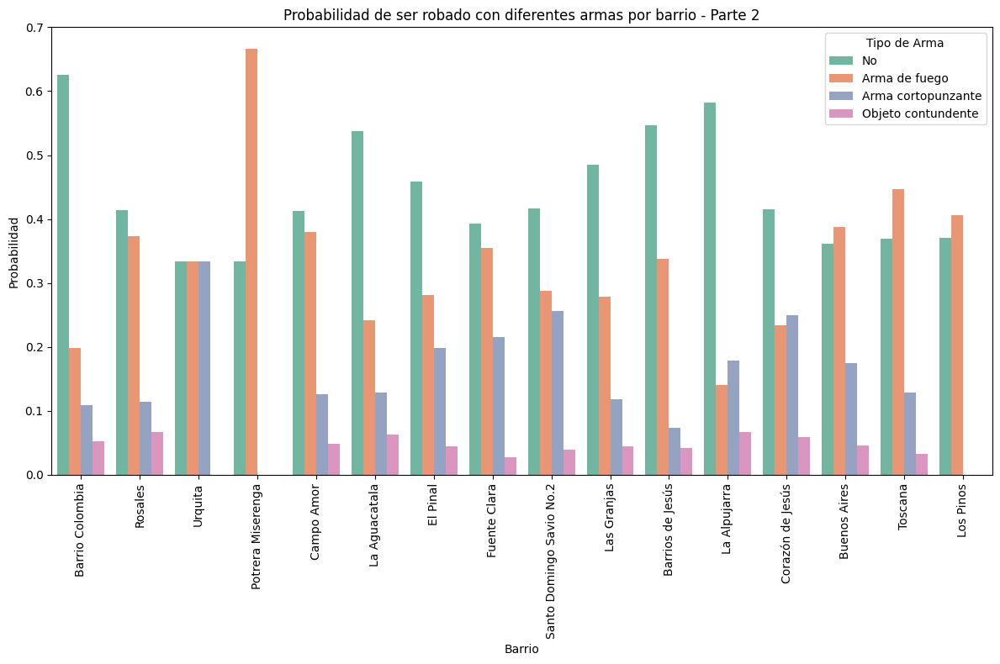

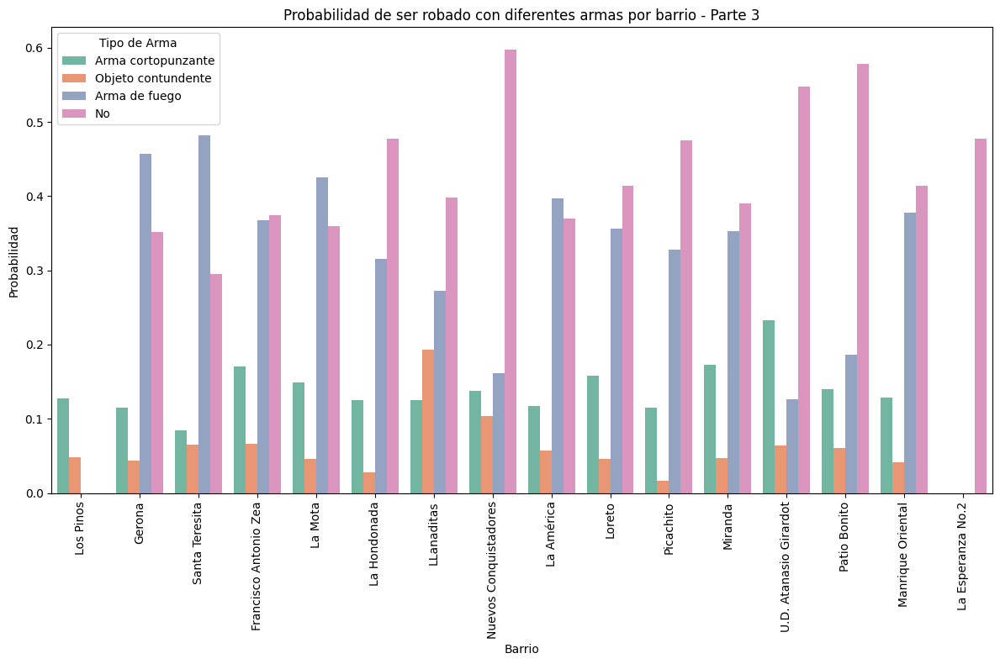

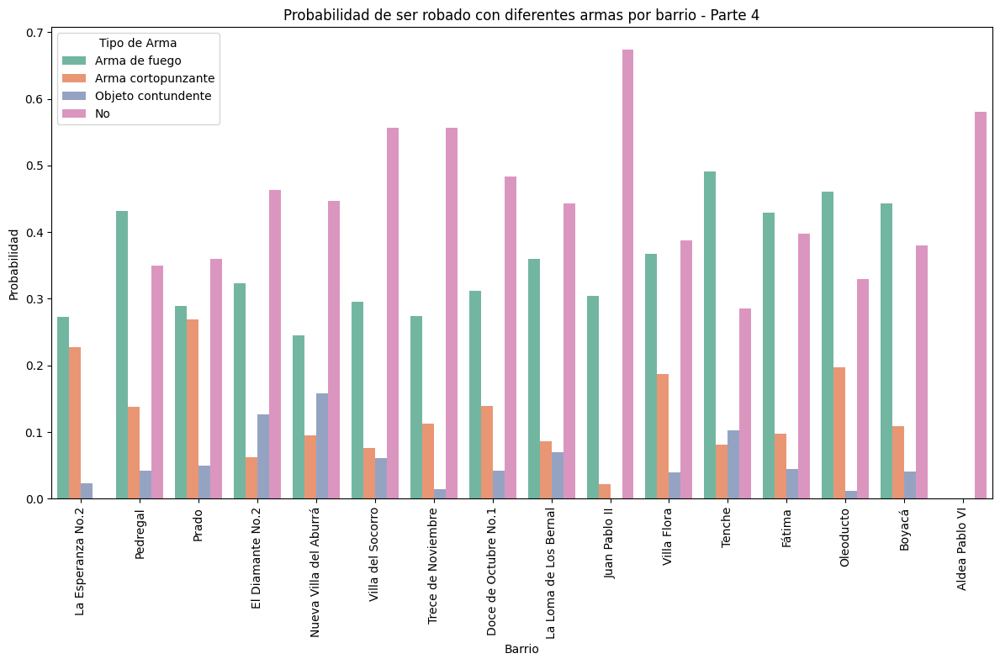

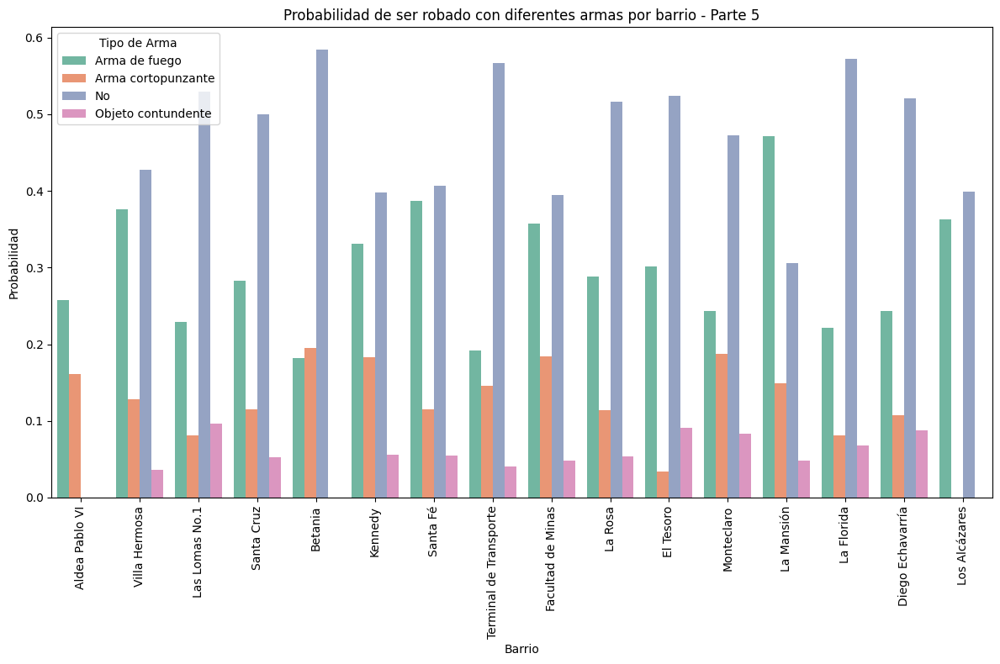

...

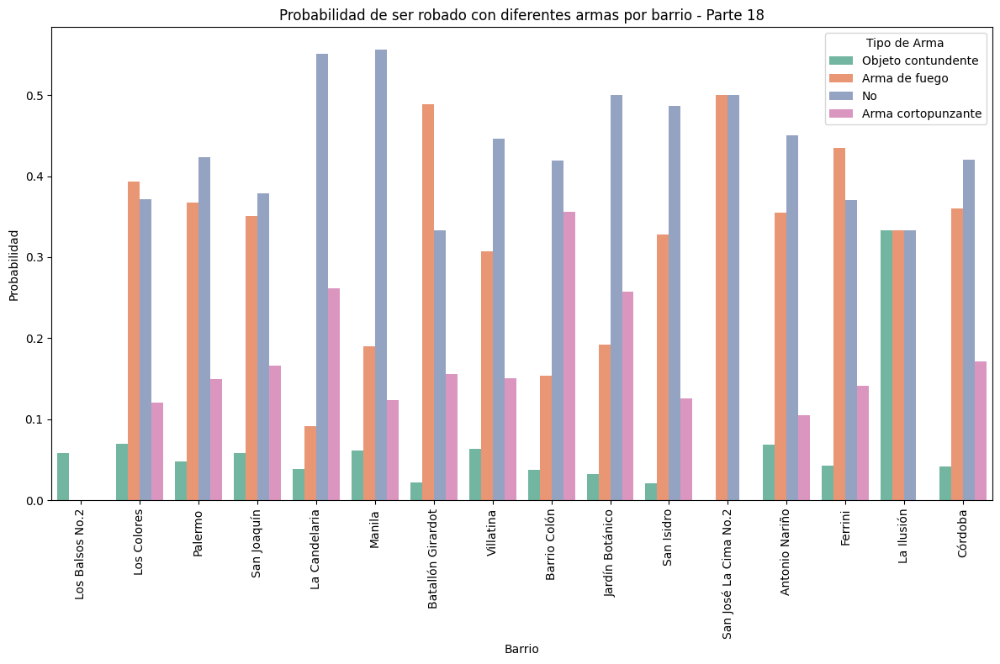

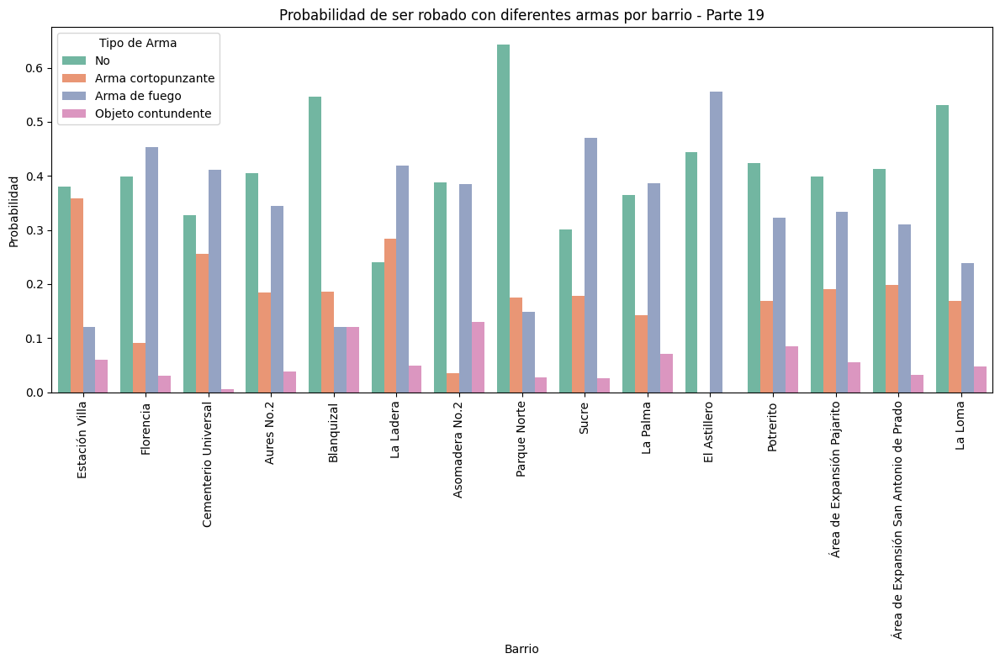

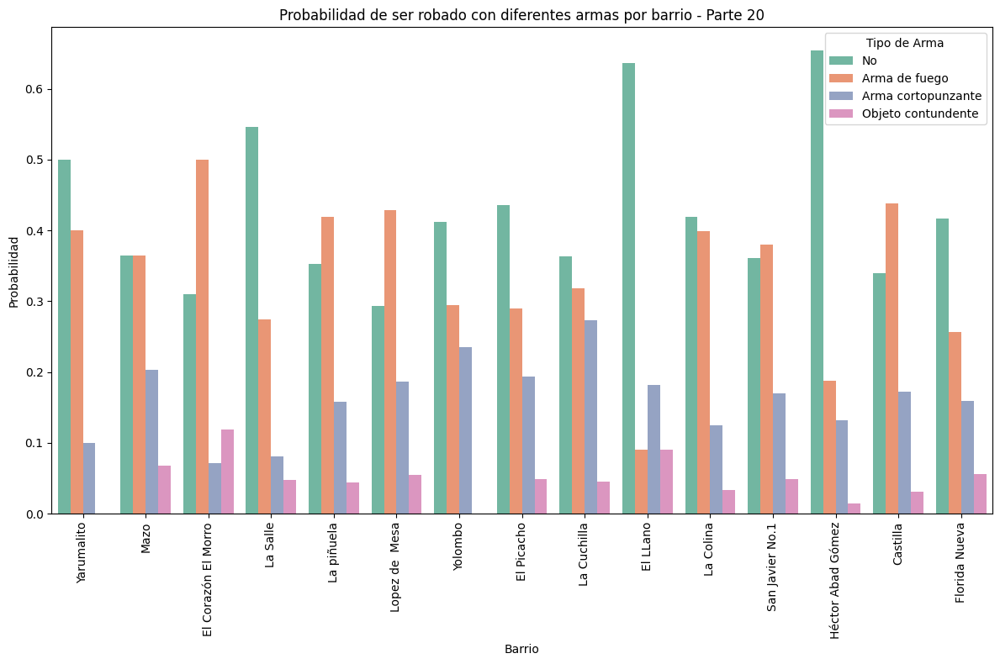

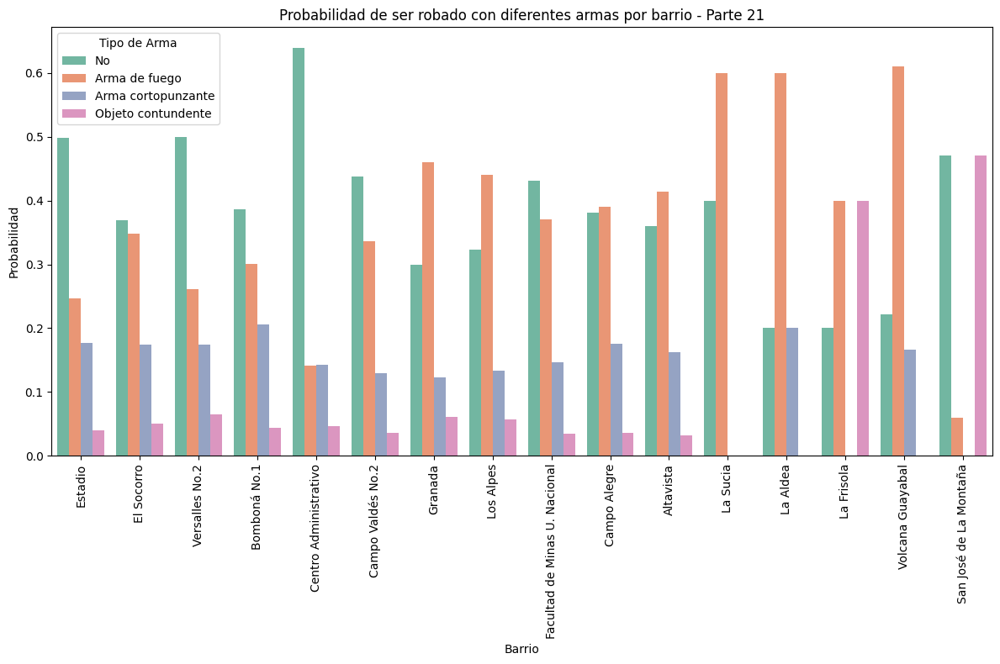

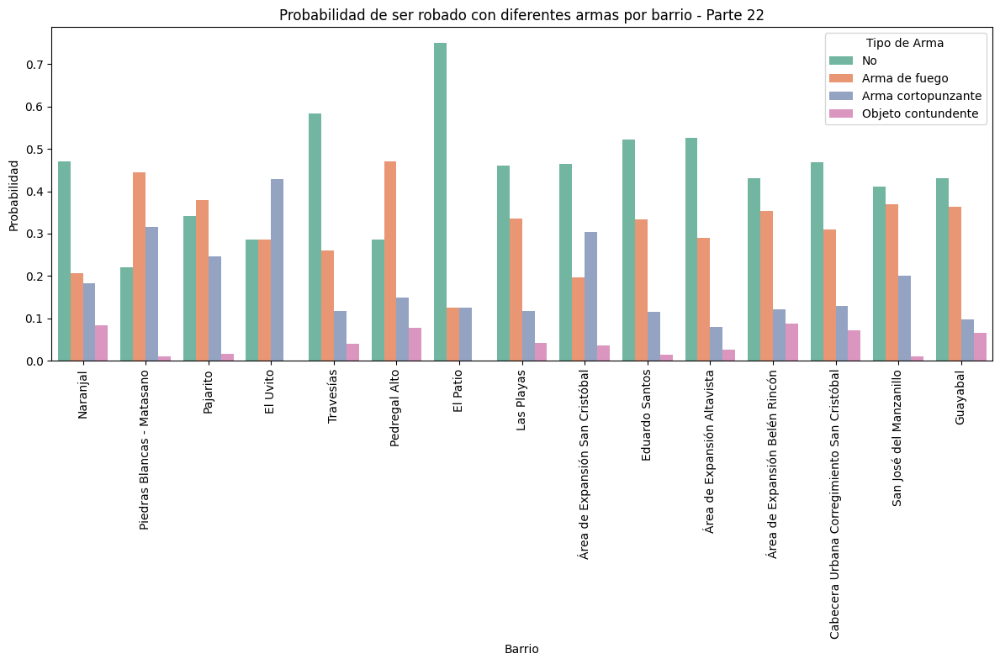

In [37]:
barrios_filtrados = barrios_probabilidades[(barrios_probabilidades['arma_medio'].isin(categorias_seleccionadas)) &
                                           (barrios_probabilidades['probabilidad'] != 1)]

# Dividir los barrios en grupos para múltiples gráficos
n = 60  # Cantidad de barrios por gráfico
num_graficos = (len(barrios_filtrados) - 1) // n + 1  # Calcular la cantidad de gráficos necesarios

# Iterar sobre cada grupo de barrios y crear un gráfico para cada uno
for i, df_grupo in enumerate(np.array_split(barrios_filtrados, num_graficos)):
    plt.figure(figsize=(12, 8))
    sns.barplot(x='NOMBRE', y='probabilidad', hue='arma_medio', data=df_grupo, palette='Set2')
    plt.xlabel('Barrio')
    plt.ylabel('Probabilidad')
    plt.title(f'Probabilidad de ser robado con diferentes armas por barrio - Parte {i+1}')
    plt.xticks(rotation=90)
    plt.legend(title='Tipo de Arma')
    plt.tight_layout()
    plt.show()

#¿Cómo visualizamos los 50 barrios con más hurtos y su probabilidad de ser robado?

Este bloque de código responde a la pregunta de cómo podemos visualizar los barrios de Medellín con la mayor cantidad de hurtos y, simultáneamente, mostrar la probabilidad de ser robado en esos barrios.

<ipython-input-38-c224fb50ac78>:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(barrios['NOMBRE'], rotation=90)


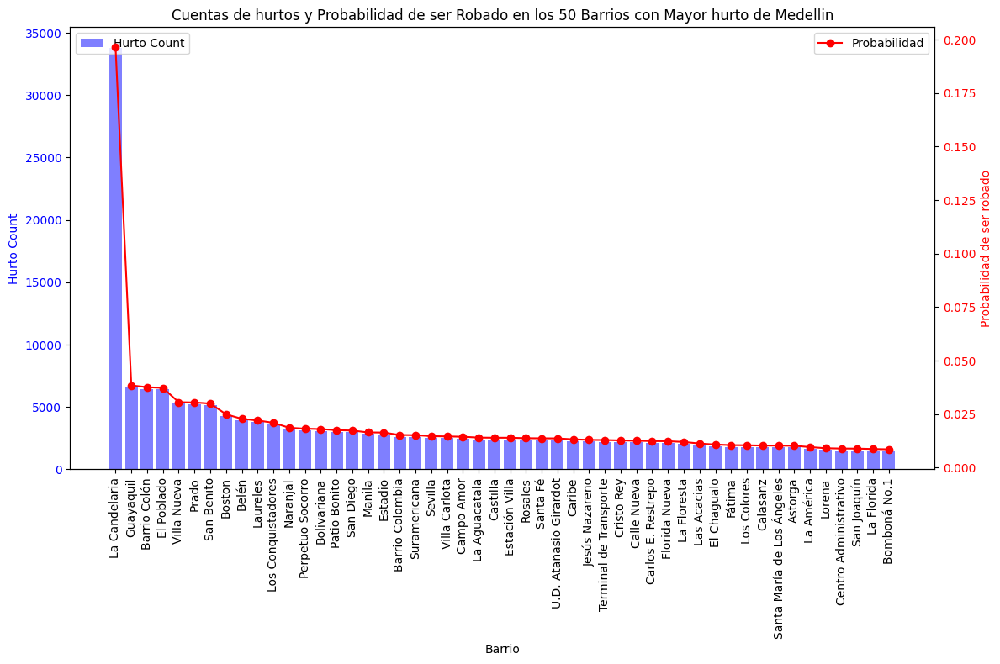

In [38]:
barrios = barrios.sort_values(by='hurto_count', ascending=False).head(50)

# Calcular la suma total de hurto_count en los 50 barrios
total_hurtos = barrios['hurto_count'].sum()

# Calcular la probabilidad de ser robado en cada barrio
barrios['probabilidad'] = barrios['hurto_count'] / total_hurtos

# Plotear los barrios con hurto_count y probabilidad
fig, ax1 = plt.subplots(figsize=(12, 8))

# Gráfico de barras para hurto_count
ax1.bar(barrios['NOMBRE'], barrios['hurto_count'], color='b', alpha=0.5, label='Hurto Count')
ax1.set_xlabel('Barrio')
ax1.set_ylabel('Hurto Count', color='b')
ax1.tick_params(axis='y', labelcolor='b')
ax1.set_xticklabels(barrios['NOMBRE'], rotation=90)

# Segundo eje y para probabilidad
ax2 = ax1.twinx()
ax2.plot(barrios['NOMBRE'], barrios['probabilidad'], color='r', marker='o', label='Probabilidad')
ax2.set_ylabel('Probabilidad de ser robado', color='r')
ax2.tick_params(axis='y', labelcolor='r')

# Añadir leyenda y título
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.title('Cuentas de hurtos y Probabilidad de ser Robado en los 50 Barrios con Mayor hurto de Medellin')

plt.tight_layout()
plt.show()

como podemos observar el grueso de hurtos se encuentra en la candelaria lo que deja a los otros barrios con baja probabilidad de ocurrencia, por lo que se procedera a calcular estas probabilidades sin incluir este barrio

In [39]:
# Excluir el barrio "La Candelaria"
barrios_sin_candelaria = barrios[barrios['NOMBRE'] != "La Candelaria"]

# Calcular la nueva suma total de hurtos sin incluir "La Candelaria"
total_hurtos_sin_candelaria = barrios_sin_candelaria['hurto_count'].sum()

# Calcular la nueva probabilidad de ser robado en cada barrio sin incluir "La Candelaria"
barrios_sin_candelaria['probabilidad'] = barrios_sin_candelaria['hurto_count'] / total_hurtos_sin_candelaria


/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


<ipython-input-40-736bbab3b1a4>:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(barrios_sin_candelaria['NOMBRE'], rotation=90)


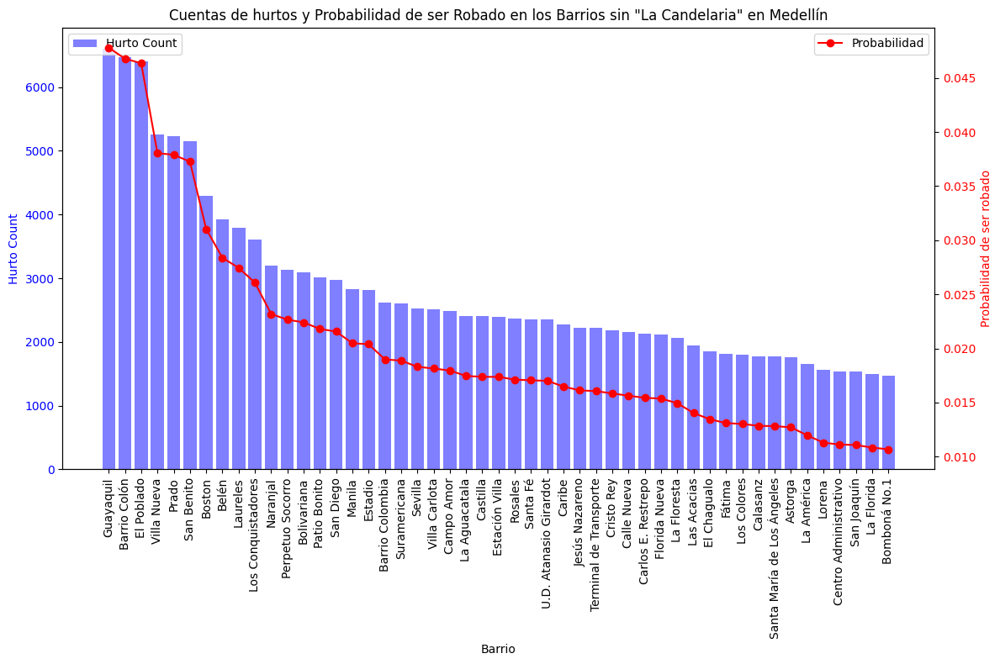

In [40]:
# Plotear los barrios con hurto_count y probabilidad sin incluir "La Candelaria"
fig, ax1 = plt.subplots(figsize=(12, 8))

# Gráfico de barras para hurto_count
ax1.bar(barrios_sin_candelaria['NOMBRE'], barrios_sin_candelaria['hurto_count'], color='b', alpha=0.5, label='Hurto Count')
ax1.set_xlabel('Barrio')
ax1.set_ylabel('Hurto Count', color='b')
ax1.tick_params(axis='y', labelcolor='b')
ax1.set_xticklabels(barrios_sin_candelaria['NOMBRE'], rotation=90)

# Segundo eje y para probabilidad
ax2 = ax1.twinx()
ax2.plot(barrios_sin_candelaria['NOMBRE'], barrios_sin_candelaria['probabilidad'], color='r', marker='o', label='Probabilidad')
ax2.set_ylabel('Probabilidad de ser robado', color='r')
ax2.tick_params(axis='y', labelcolor='r')

# Añadir leyenda y título
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.title('Cuentas de hurtos y Probabilidad de ser Robado en los Barrios sin "La Candelaria" en Medellín')

plt.tight_layout()
plt.show()

#¿Cómo podemos calcular las probabilidades de robo y la distribución de género en los robos en Medellín?

Para abordar esta pregunta, utilizamos probabilidades bayesianas para calcular la probabilidad de robo en cada barrio de Medellín, así como la probabilidad de que una persona robada sea hombre o mujer.

In [41]:
# Calcular la probabilidad de robo en cada barrio
P_robo = hurto_barrios['NOMBRE'].value_counts(normalize=True)

# Calcular la probabilidad de ser hombre entre las personas robadas
P_hombre = (hurto_barrios['sexo'] == 'Hombre').mean()  # Probabilidad de ser hombre

# Calcular la probabilidad de ser mujer entre las personas robadas
P_mujer = (hurto_barrios['sexo'] == 'Mujer').mean()    # Probabilidad de ser mujer

print(f'Probabilidad de robo:\n{P_robo}\n')
print(f'Probabilidad de ser Hombre: {P_hombre:.2f}')
print(f'Probabilidad de ser Mujer: {P_mujer:.2f}')

Probabilidad de robo:
NOMBRE
La Candelaria                 0.118850
Guayaquil                     0.023246
Barrio Colón                  0.022753
El Poblado                    0.022546
Villa Nueva                   0.018505
                                ...   
La Ilusión                    0.000011
Potrera Miserenga             0.000011
Urquita                       0.000011
La Suiza                      0.000004
Área de Expansión El Noral    0.000004
Name: proportion, Length: 320, dtype: float64

Probabilidad de ser Hombre: 0.58
Probabilidad de ser Mujer: 0.41


Para calcular las probabilidades de robo en cada barrio de Medellín, diferenciando si la persona robada es hombre o mujer, utilizamos probabilidades condicionales. Esto nos permite entender mejor la distribución de los robos por género en los diferentes barrios.

In [42]:
# Calcular probabilidades condicionales para hombres
prob_cond_hombre = hurto_barrios[hurto_barrios['sexo'] == 'Hombre']['NOMBRE'].value_counts(normalize=True)

# Calcular probabilidades condicionales para mujeres
prob_cond_mujer = hurto_barrios[hurto_barrios['sexo'] == 'Mujer']['NOMBRE'].value_counts(normalize=True)

# Imprimir las probabilidades condicionales
print(f'Probabilidad de robo dado que la persona es Hombre:\n{prob_cond_hombre}\n')
print(f'Probabilidad de robo dado que la persona es Mujer:\n{prob_cond_mujer}\n')

Probabilidad de robo dado que la persona es Hombre:
NOMBRE
La Candelaria    0.107093
El Poblado       0.023365
Villa Nueva      0.020532
San Benito       0.019940
Guayaquil        0.019910
                   ...   
El Astillero     0.000018
La Ilusión       0.000018
La Frisola       0.000018
Urquita          0.000012
La Suiza         0.000006
Name: proportion, Length: 319, dtype: float64

Probabilidad de robo dado que la persona es Mujer:
NOMBRE
La Candelaria                 0.135511
Guayaquil                     0.027995
Barrio Colón                  0.027569
El Poblado                    0.021418
Prado                         0.017755
                                ...   
Volcana Guayabal              0.000009
Urquita                       0.000009
El Jardín                     0.000009
El Uvito                      0.000009
Área de Expansión El Noral    0.000009
Name: proportion, Length: 314, dtype: float64



#Ploteando estas probabilidades

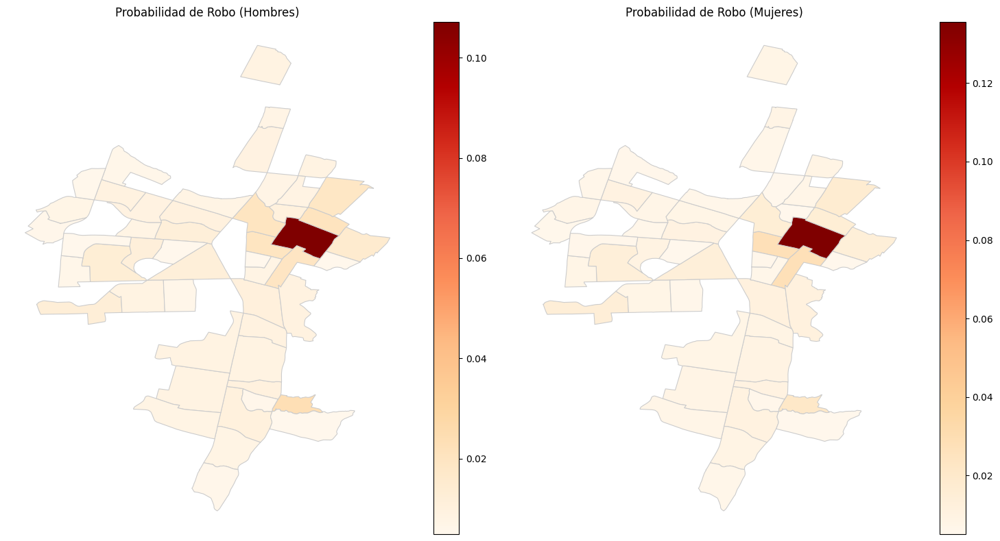

In [43]:
barrios['prob_cond_hombre'] = prob_cond_hombre.reindex(barrios['NOMBRE']).values
barrios['prob_cond_mujer'] = prob_cond_mujer.reindex(barrios['NOMBRE']).values

fig, axs = plt.subplots(1, 2, figsize=(15, 8))

# Mapa para hombres
axs[0].set_title('Probabilidad de Robo (Hombres)')
barrios.plot(column='prob_cond_hombre', cmap='OrRd', linewidth=0.8, ax=axs[0], edgecolor='0.8', legend=True)

# Mapa para mujeres
axs[1].set_title('Probabilidad de Robo (Mujeres)')
barrios.plot(column='prob_cond_mujer', cmap='OrRd', linewidth=0.8, ax=axs[1], edgecolor='0.8', legend=True)

# Ajustes finales
for ax in axs:
    ax.axis('off')  # Desactivar ejes
    ax.set_aspect('auto')  # Ajustar aspecto

plt.tight_layout()
plt.show()

De la misma manera nos encontramos con el mismo problema, el barrio la candelaria no nos permite visualizar la informacion de manera correcta, por lo que se procede a hacer los mismo sin el

In [44]:
barrios_sin_candelaria['prob_cond_hombre'] = prob_cond_hombre.reindex(barrios_sin_candelaria['NOMBRE']).values
barrios_sin_candelaria['prob_cond_mujer'] = prob_cond_mujer.reindex(barrios_sin_candelaria['NOMBRE']).values

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


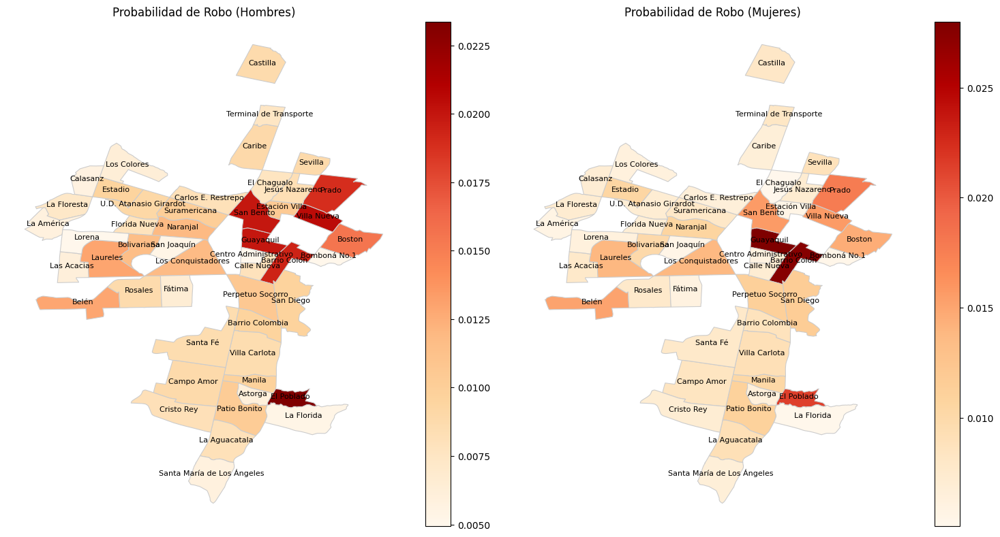

In [45]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

# Mapa para hombres
axs[0].set_title('Probabilidad de Robo (Hombres)')
barrios_sin_candelaria.plot(column='prob_cond_hombre', cmap='OrRd', linewidth=0.8, ax=axs[0], edgecolor='0.8', legend=True)

# Añadir etiquetas a los polígonos de los barrios (hombres)
for idx, row in barrios_sin_candelaria.iterrows():
    axs[0].annotate(text=row['NOMBRE'], xy=row['geometry'].centroid.coords[0], fontsize=8, ha='center')

# Mapa para mujeres
axs[1].set_title('Probabilidad de Robo (Mujeres)')
barrios_sin_candelaria.plot(column='prob_cond_mujer', cmap='OrRd', linewidth=0.8, ax=axs[1], edgecolor='0.8', legend=True)

# Añadir etiquetas a los polígonos de los barrios (mujeres)
for idx, row in barrios_sin_candelaria.iterrows():
    axs[1].annotate(text=row['NOMBRE'], xy=row['geometry'].centroid.coords[0], fontsize=8, ha='center')

# Ajustes finales
for ax in axs:
    ax.axis('off')  # Desactivar ejes
    ax.set_aspect('auto')  # Ajustar aspecto

plt.tight_layout()
plt.show()

#¿Cómo se calcula la diferencia entre las probabilidades de robo para hombres y mujeres en cada barrio, excluyendo "La Candelaria"?

Para entender mejor cómo varía la probabilidad de robo entre hombres y mujeres en cada barrio (excluyendo "La Candelaria"), podemos calcular la diferencia entre estas probabilidades.

#Razones para Calcular esta Diferencia


*   Comparación de riesgos: Calcular esta diferencia nos permite comparar directamente el riesgo de robo entre hombres y mujeres en cada barrio.
*   Identificación de disparidades: Las diferencias significativas pueden señalar barrios donde un género específico es más vulnerable al robo.
*   Planificación de seguridad: Conocer estas diferencias puede ayudar a diseñar estrategias de seguridad más adecuadas para cada barrio.

#Interpretacion

**Diferencia positiva:** Si el valor de diferencia_prob es positivo, indica que la probabilidad de robo es mayor para los hombres en ese barrio.
**Diferencia negativa:** Si el valor de diferencia_prob es negativo, indica que la probabilidad de robo es mayor para las mujeres en ese barrio.
**Diferencia cercana a cero:** Si el valor es cercano a cero, sugiere que no hay una diferencia significativa en las probabilidades de robo entre hombres y mujeres en ese barrio.




In [46]:
barrios_sin_candelaria['diferencia_prob'] = barrios_sin_candelaria['prob_cond_hombre'] - barrios_sin_candelaria['prob_cond_mujer']

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


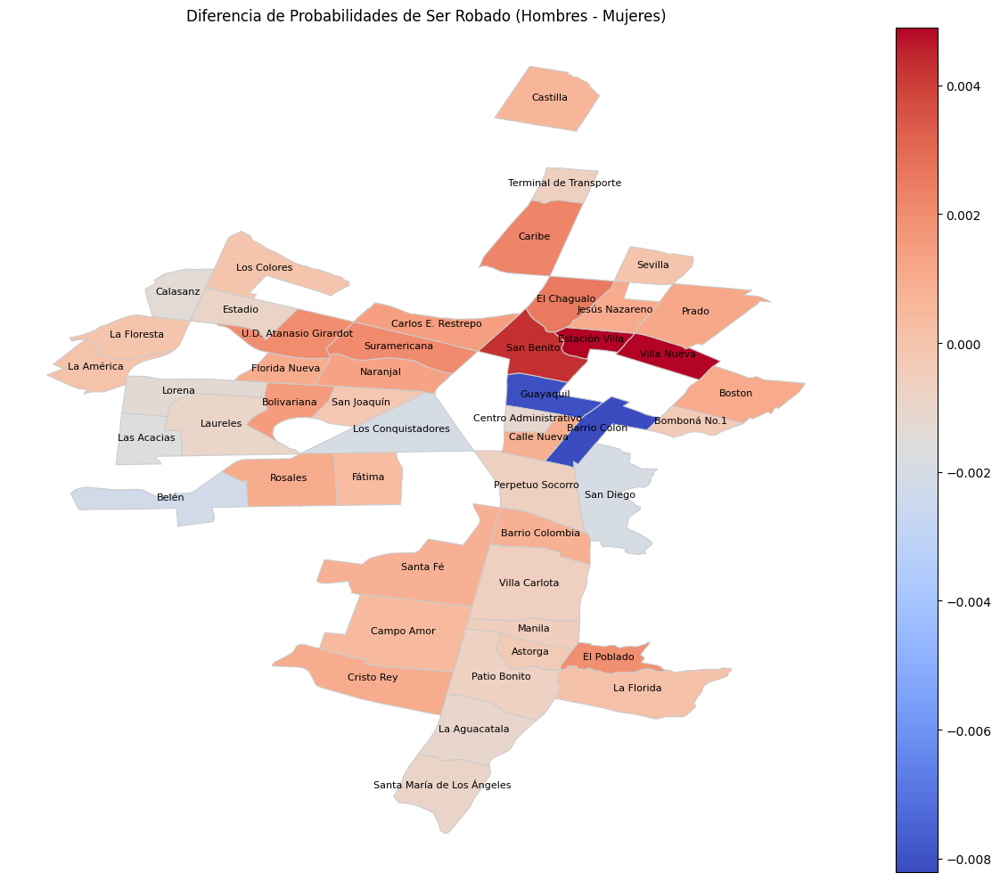

In [47]:
# Crear el mapa
fig, ax = plt.subplots(figsize=(12, 10))

# Colorear los barrios según la diferencia de probabilidades
barrios_sin_candelaria.plot(column='diferencia_prob', cmap='coolwarm', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)

# Añadir etiquetas a los polígonos de los barrios
for idx, row in barrios_sin_candelaria.iterrows():
    ax.annotate(text=row['NOMBRE'], xy=row['geometry'].centroid.coords[0], fontsize=8, ha='center')

# Ajustes finales
ax.set_title('Diferencia de Probabilidades de Ser Robado (Hombres - Mujeres)')
ax.axis('off')  # Desactivar ejes
ax.set_aspect('auto')  # Ajustar aspecto

plt.tight_layout()
plt.show()

# definiremos un intervalo de edad para cada persona robada

In [48]:
# Definir los rangos de edad
bins = [0, 18, 30, 45, 60, 100]
labels = ['0-18', '19-30', '31-45', '46-60', '60+']

# Crear una nueva columna 'grupo_edad' en el DataFrame de hurtos
hurto_barrios['grupo_edad'] = pd.cut(hurto_barrios['edad'], bins=bins, labels=labels, right=False)

# Convertimos algunos dados en el formato adecuado, empezemos por la fecha del hecho

Pasar la columna fecha_hecho' en un formato de Datetime

In [49]:
hurto_barrios['fecha_hecho'] = pd.to_datetime(hurto_barrios['fecha_hecho'])

In [50]:
print(hurto_barrios['fecha_hecho'].dtypes)

datetime64[ns, UTC-05:00]


Obtener datos de la muestra por años

año_hecho
2003     3864
2004     4248
2005     5236
2006     3097
2007     2355
2008     3614
2009     3050
2010     2330
2011     1375
2012     2299
2013     4391
2014     7719
2015    12051
2016    18034
2017    26307
2018    37652
2019    45502
2020    27639
2021    34650
2022    39132
Name: count, dtype: int64


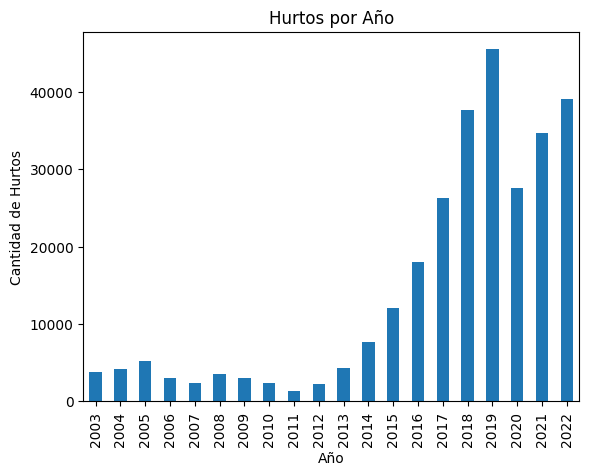

In [51]:
hurto_barrios['año_hecho'] = hurto_barrios['fecha_hecho'].dt.year

# Contar hurtos por año
hurtos_por_año = hurto_barrios['año_hecho'].value_counts().sort_index()
print(hurtos_por_año)

# Graficar hurtos por año
hurtos_por_año.plot(kind='bar', title='Hurtos por Año')
plt.xlabel('Año')
plt.ylabel('Cantidad de Hurtos')
plt.show()

Ahora por Mes

mes_hecho
1     22227
2     21439
3     21772
4     19962
5     22073
6     21123
7     22405
8     27034
9     25519
10    27253
11    27120
12    26618
Name: count, dtype: int64


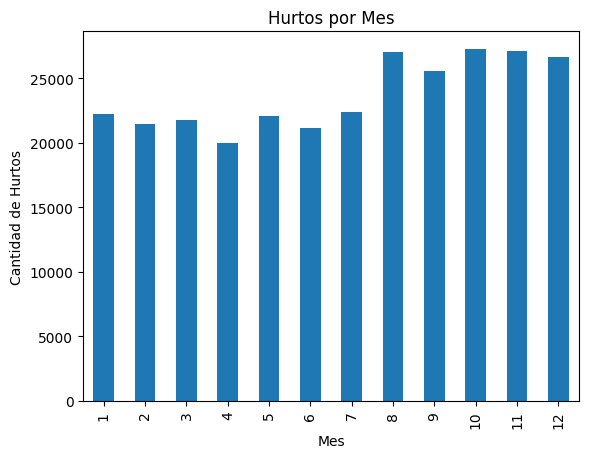

In [52]:
hurto_barrios['mes_hecho'] = hurto_barrios['fecha_hecho'].dt.month

hurtos_por_mes = hurto_barrios['mes_hecho'].value_counts().sort_index()
print(hurtos_por_mes)

hurtos_por_mes.plot(kind='bar', title='Hurtos por Mes')
plt.xlabel('Mes')
plt.ylabel('Cantidad de Hurtos')
plt.show()

Por dia de la semana

dia_semana_hecho
Friday       46805
Monday       37337
Saturday     45220
Sunday       27199
Thursday     43396
Tuesday      40832
Wednesday    43756
Name: count, dtype: int64


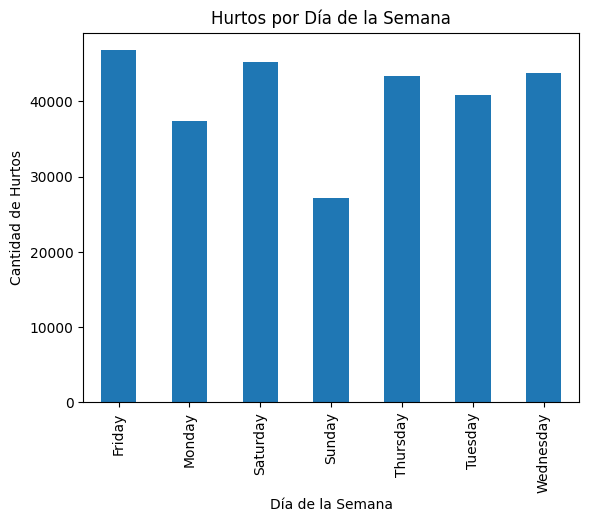

In [53]:
hurto_barrios['dia_semana_hecho'] = hurto_barrios['fecha_hecho'].dt.day_name()

hurtos_por_dia_semana = hurto_barrios['dia_semana_hecho'].value_counts().sort_index()
print(hurtos_por_dia_semana)

hurtos_por_dia_semana.plot(kind='bar', title='Hurtos por Día de la Semana')
plt.xlabel('Día de la Semana')
plt.ylabel('Cantidad de Hurtos')
plt.show()

#Extraer informacion relevante

In [54]:
hurto_barrios['hora'] = hurto_barrios['fecha_hecho'].dt.hour  # Extraer la hora
hurto_barrios['dia_semana'] = hurto_barrios['fecha_hecho'].dt.day_name()  # Extraer el día de la semana

In [55]:
hurto_barrios['mes'] = hurto_barrios['fecha_hecho'].dt.month
hurto_por_mes = hurto_barrios.groupby('mes').size()

#Plot de robos por mes

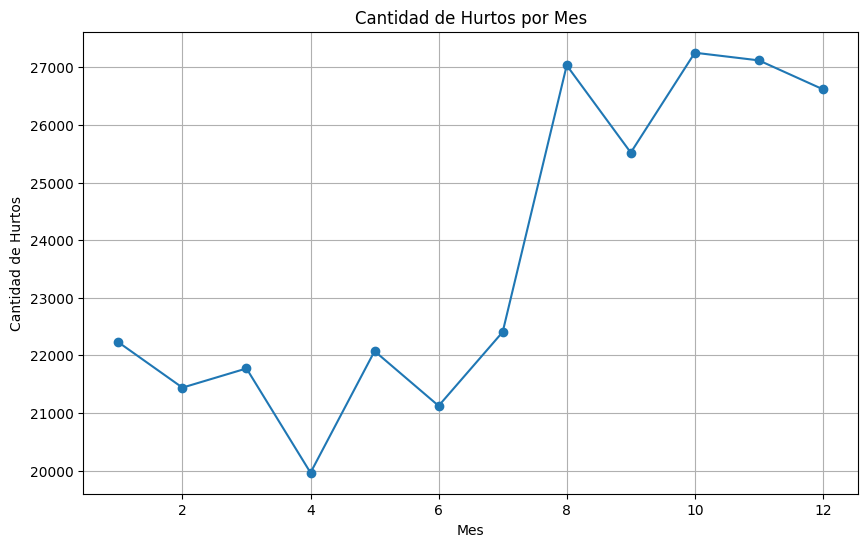

In [56]:
# Gráfico de línea de tiempo de hurtos por mes
hurto_por_mes.plot(kind='line', figsize=(10, 6), marker='o')
plt.title('Cantidad de Hurtos por Mes')
plt.xlabel('Mes')
plt.ylabel('Cantidad de Hurtos')
plt.grid(True)
plt.show()

#Plot de hurtos por hora

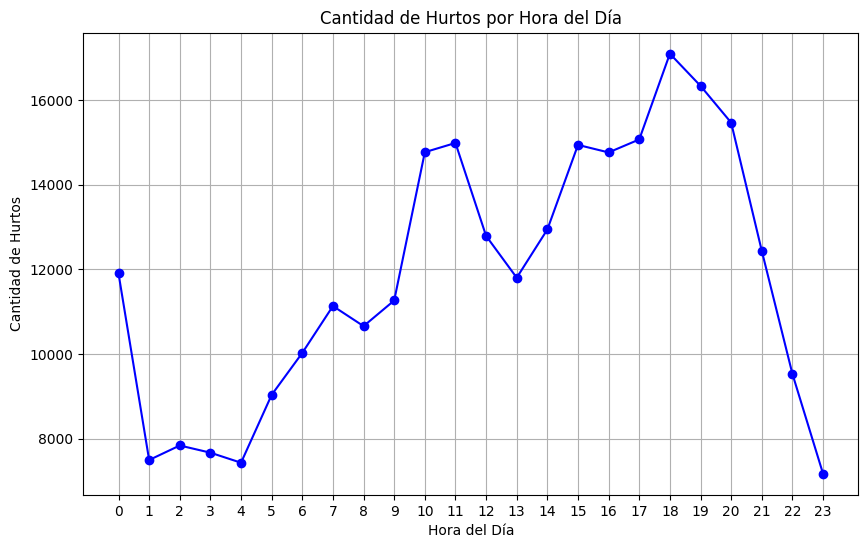

In [57]:
hurtos_por_hora = hurto_barrios.groupby('hora')['cantidad'].sum()

# Graficar la cantidad de hurtos por hora del día
plt.figure(figsize=(10, 6))
plt.plot(hurtos_por_hora.index, hurtos_por_hora.values, marker='o', linestyle='-', color='b')
plt.title('Cantidad de Hurtos por Hora del Día')
plt.xlabel('Hora del Día')
plt.ylabel('Cantidad de Hurtos')
plt.xticks(range(24))  # Definir las etiquetas del eje x como las horas del día (0-23)
plt.grid(True)
plt.show()